# Analyse exploratoire 

# <a name="C0">SOMMAIRE</a>
- <a href="#C2">Analyses univariées</a>
- <a href="#C3">Analyses bivariées</a>
- <a href="#C4">Analyses multivariées</a>
- <a href="#C5"> Partition ? Clustering et Clustering x ACP</a>
- <a href="#C6">  L'application </a>

### Ce qu'il faut faire :

#### 1) Nettoyage :  => Déjà fait
    - lire definitions des variables (ex nutriscore)
    - idée d'application (inspi kaggle ? par catégorie par pays mots clefs pour regrouper ?)
    - filtrer jeu données , seule var indispensable à mon application
    - traiter valeurs aberrantes // contexte projet 
    - valeurs manquantes :
         - remplacer données manquantes (0 moy mediane)
         - estimer avec algo KNN ou
         - fonction IterativeImputer (only via corrélation)
#### 2) Analyse exploratoire ==> A FAIRE ICI
    - analyses univariées ( describe.. graph numérique ou catégorielle)
    - bivariées ( graphiques croisant var numérique et une catégorielle OU croisant 2 numériques + matrice de corrélation)
    => matplotlib et seaborn, ex illustrer nb articles vendus ds chaque pays, répartition nutriscore ds chacun d'entre eux
    - multivariées 
    => descriptive avec ACP Analyse en Composantes Principales
    => explicative avec l'ANOVA
#### 3) Présentation de l'idée d'application ( c'est tout )
    - un graph présenté = une analyse = vérifier une hypothèse ou déclencher une action sur les données
    
# <a name="C1">Set up environnement</a>
<a href="#C0">SOMMAIRE</a>
    

In [1]:
#Import des librairies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import isnan
%matplotlib inline

In [2]:
#Import des données
data = pd.read_csv('C:/Users/Me/Documents/1- DATA SCIENCE/datapostnettoyagefood.csv')

C:\Users\Me\AppData\Local\Temp\ipykernel_7420\2387548706.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('C:/Users/Me/Documents/1- DATA SCIENCE/datapostnettoyagefood.csv')


In [3]:
#Réglages d'affichage
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', 2000)

# Rappel du thème utilisé
sns.set_style('darkgrid')
sns.set_palette('Set2')

## Pour rappel quelques infos sur le jeu de données après traitement

In [4]:
#je remplace les tirets par des underscore dans le noms des colonnes
data.columns=['code', 'url', 'product_name', 'brands', 'countries','countries_tags','countries_fr',
       'ingredients_text', 'additives_n', 'additives', 'energy_100g',
       'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'nutrition_score_fr_100g','nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2',
       'main_category_fr']

In [5]:
data.info()
print(round(100-(data.isnull().sum()/len(data)*100),2))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282988 entries, 0 to 282987
Data columns (total 24 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     282988 non-null  object 
 1   url                      282988 non-null  object 
 2   product_name             282988 non-null  object 
 3   brands                   277591 non-null  object 
 4   countries                282850 non-null  object 
 5   countries_tags           282850 non-null  object 
 6   countries_fr             282850 non-null  object 
 7   ingredients_text         246999 non-null  object 
 8   additives_n              246999 non-null  float64
 9   additives                246968 non-null  object 
 10  energy_100g              282988 non-null  float64
 11  fat_100g                 282988 non-null  float64
 12  saturated_fat_100g       282988 non-null  float64
 13  carbohydrates_100g       282988 non-null  float64
 14  suga

# <a name="C2">Analyses univariées</a>
<a href="#C0">SOMMAIRE</a>

Représentations des nombres de produits par catégories (quand elle est renseignée)

In [1]:
data["pnns_groups_1"].unique()

NameError: name 'data' is not defined

Nombre de produits dont la catégorie est renseignée : 68340


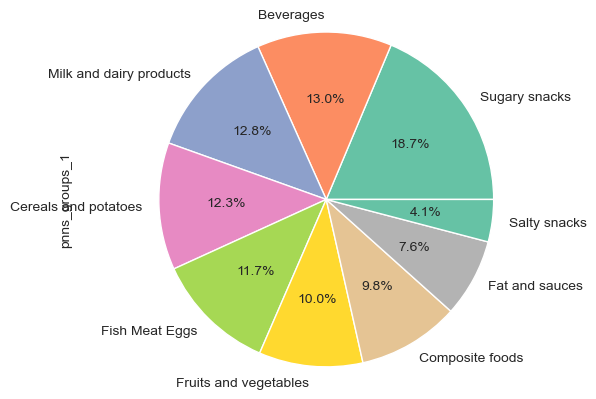

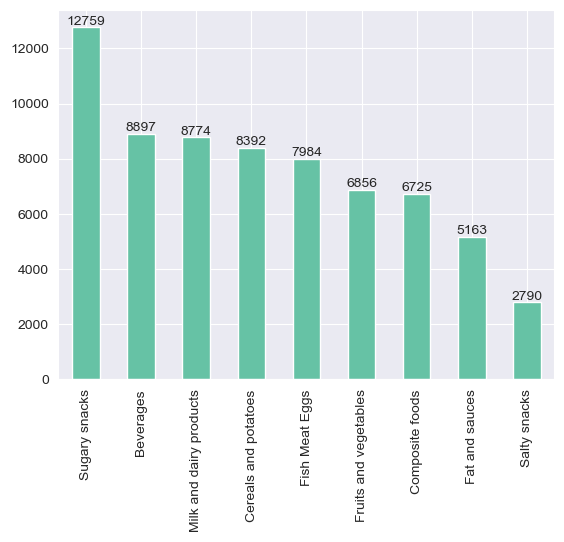

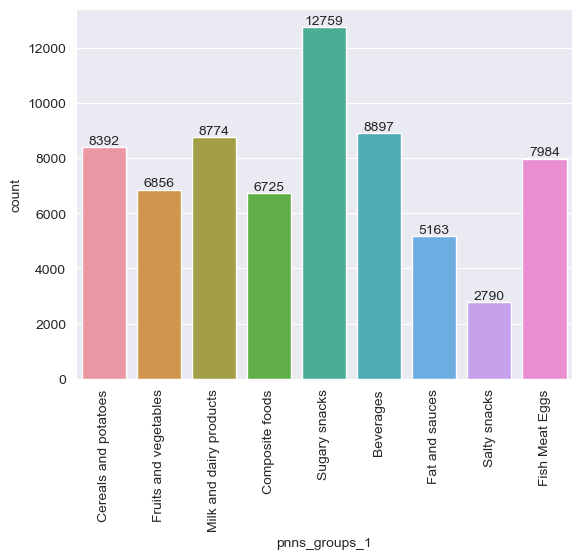

In [7]:
print('Nombre de produits dont la catégorie est renseignée :',len(data[~data["pnns_groups_1"].isnull()]))

# Diagramme en secteurs
data["pnns_groups_1"].value_counts(normalize=True).plot(kind='pie', autopct='%1.1f%%')
# Cette ligne assure que le pie chart est un cercle plutôt qu'une éllipse
plt.axis('equal') 
plt.xticks
plt.show() # Affiche le graphique

# Diagramme en tuyaux d'orgues
bx=data["pnns_groups_1"].value_counts(normalize=False).plot(kind='bar')
bx.bar_label(bx.containers[0])
bx.set_xticklabels(bx.get_xticklabels(), rotation=90)
plt.show()

# seaborn countplot
ax = sns.countplot(x='pnns_groups_1', data=data)
ax.bar_label(ax.containers[0])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

Sur la partie countries => on pourrait compter le nombre d'occurence de chaque pays ? et faire un tableau avec les catégories ?

In [8]:
print(len(data.countries.unique()))
rawcountries=data.countries.unique().tolist()
rawcountries2=' ,'.join(map(str,rawcountries))

1229


In [9]:
rawcountries

['Deutschland',
 'France',
 'United States',
 'Canada',
 'Belgique,France,Suisse',
 'France,Espagne',
 'France,Espagne,Portugal',
 'Saint Pierre and Miquelon, en:france, en:belgium',
 'Québec, Canada',
 'United Kingdom',
 'France,Maroc',
 'United States, en:france',
 'France, en:switzerland',
 'France,Suisse',
 'France,Royaume-Uni',
 'United Kingdom, US',
 'France,États-Unis',
 'France,Belgique, Suisse',
 'France, Suisse',
 'Россия',
 'UK,France',
 'France,Espagne,Italie,Portugal',
 'Guadeloupe,France',
 'France, US',
 'France, en:belgium',
 'Switzerland',
 'Allemagne',
 'United Kingdom, en:france',
 'Belgium,France',
 'États-Unis',
 'France,Switzerland',
 'Martinique',
 'España',
 'Guadeloupe',
 'France,Italie',
 'France,United Kingdom',
 'United Kingdom,France',
 'Belgique,France',
 'France,Nouvelle-Calédonie',
 'Canada,United States',
 'France, en:reunion',
 'United States,United Kingdom,UK',
 'Autriche,Danemark,France,Allemagne,Pays-Bas,Espagne,Suisse',
 'Serbia',
 'Belgique',
 'en

In [10]:
mylist=rawcountries2.split(sep=',', maxsplit=-1)
myset = set(mylist)
myset=list(myset)
print('nb différentes occurences initiales :',len(mylist))
print('nb différentes occurences post traitement :',len(myset))

nb différentes occurences initiales : 3110
nb différentes occurences post traitement : 714


### Comparaison nutriscore calculé et nutriscore donnée par les données

In [11]:
def nutriscorebev(score):
    if score >40 : return 'error'
    if score <-15 : return 'error'
    if score>=10 : return 'e'
    if score >=6 : return 'd'
    if score >=2 : return 'c'
    if score >-1 : return 'b'
    if score <=-1 : return 'a'

def nutriscore(score):
    if score >40 : return 'error'
    if score <-15 : return 'error'
    if score>=19 : return 'e'
    if score >=11 : return 'd'
    if score >=3 : return 'c'
    if score >=0 : return 'b'
    if score <0 : return 'a'
    

In [12]:
#Discrétisation de la variable NUTRISCORE
#création de la var nutriscore
data['nutriscore']=np.nan
datanonbev=data.loc[~(data['pnns_groups_1']=='Beverages')]
databev=data.loc[(data['pnns_groups_1']=='Beverages')]
datanonbev['nutriscore']=datanonbev.apply(lambda row: nutriscore(row.nutrition_score_fr_100g), axis = 1)
databev['nutriscore']=databev.apply(lambda row: nutriscorebev(row.nutrition_score_fr_100g), axis = 1)
data.loc[~(data['pnns_groups_1']=='Beverages'),'nutriscore']=datanonbev.nutriscore
data.loc[~(data['pnns_groups_1']=='Beverages'),'nutriscore']=databev.nutriscore
data=datanonbev.append(databev)


C:\Users\Me\AppData\Local\Temp\ipykernel_7420\3420649220.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datanonbev['nutriscore']=datanonbev.apply(lambda row: nutriscore(row.nutrition_score_fr_100g), axis = 1)
C:\Users\Me\AppData\Local\Temp\ipykernel_7420\3420649220.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  databev['nutriscore']=databev.apply(lambda row: nutriscorebev(row.nutrition_score_fr_100g), axis = 1)
C:\Users\Me\AppData\Local\Temp\ipykernel_7420\3420649220.py:10: FutureWarning: The fram

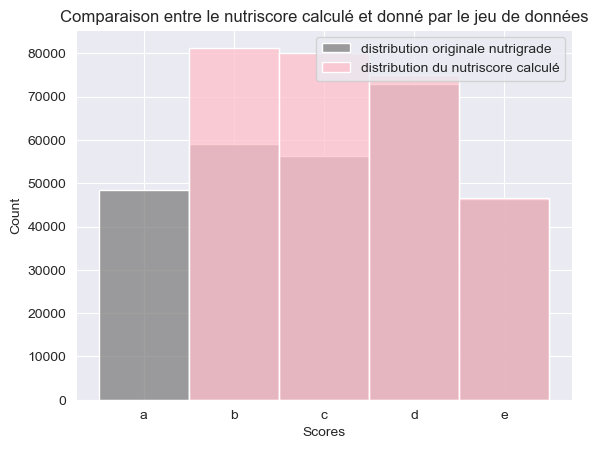

In [13]:
#comparaison
for nutri in ['nutrition_grade_fr','nutriscore'] :
    data[nutri] = pd.Categorical(data[nutri],
                                   categories=['a', 'b', 'c', 'd','e'],
                                   ordered=True)
sns.histplot(data=data['nutrition_grade_fr'],color='gray')
sns.histplot(data=data['nutriscore'],color='pink')
plt.legend(['distribution originale nutrigrade', 'distribution du nutriscore calculé'])
plt.title('Comparaison entre le nutriscore calculé et donné par le jeu de données')
plt.xlabel('Scores')
plt.show()

Conclusion je peux dropper mon nutriscore calculé.. 

In [14]:
data.drop('nutriscore',axis=1)

,code,url,product_name,brands,countries,countries_tags,countries_fr,ingredients_text,additives_n,additives,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,main_category_fr
0,4010355118431,http://world-fr.openfoodfacts.org/produit/4010355118431/kokos-in-ananas-banane-babylove,Kokos in Ananas-Banane,babylove,Deutschland,en:germany,Allemagne,"95% Früchte (49% Äpfel, 24% Ananassaft aus Ananassaftkonzentrat, 12% Bananen, 8% Kokosmilch, Acerola, Ananassaftkonzentrat), Reismehl",0.0,[ 95-fruchte -> de:95-fruchte ] [ 49-apfel -> de:49-apfel ] [ 24-ananassaft-aus-ananassaftkonzentrat -> de:24-ananassaft-aus-ananassaftkonzentrat ] [ 12-bananen -> de:12-bananen ] [ 8-kokosmilch -> de:8-kokosmilch ] [ acerola -> de:acerola ] [ ananassaftkonzentrat -> de:ananassaftkonzentrat ] [ reismehl -> de:reismehl ],363.000000,1.9,1.62,15.2,9.9,1.3,0.9,0.0250,0.009843,3.0,c,NaN,NaN,Aliments pour bébé
1,3596710315376,http://world-fr.openfoodfacts.org/produit/3596710315376/hachis-parmentier-auchan,Hachis Parmentier,Auchan,France,en:france,France,"Pommes de terre (UE) 44%, eau (France), _lait_ écrémé en poudre reconstitué (UE), viande de bœuf (France) 9,5%, oignons (UE) 5%, amidon transformé de maïs (UE/hors UE), crème liquide (UE) (contient _lait_), huile de tournesol (UE), persil (UE), sel (France).",0.0,[ pommes-de-terre -> fr:pommes-de-terre ] [ pommes-de -> fr:pommes-de ] [ pommes -> fr:pommes ] [ ue-44 -> fr:ue-44 ] [ ue -> fr:ue ] [ eau -> fr:eau ] [ france -> fr:france ] [ lait-ecreme-en-poudre-reconstitue -> fr:lait-ecreme-en-poudre-reconstitue ] [ lait-ecreme-en-poudre -> fr:lait-ecreme-en-poudre ] [ lait-ecreme-en -> fr:lait-ecreme-en ] [ lait-ecreme -> fr:lait-ecreme ] [ lait -> fr:lait ] [ ue -> fr:ue ] [ viande-de-boeuf -> fr:viande-de-boeuf ] [ viande-de -> fr:viande-de ] [ viande -> fr:viande ] [ france-9 -> fr:france-9 ] [ france -> fr:france ] [ 5 -> en:fd-c ] [ oignons -> fr:oignons ] [ ue-5 -> fr:ue-5 ] [ ue -> fr:ue ] [ amidon-transforme-de-mais -> fr:amidon-transforme-de-mais ] [ amidon-transforme-de -> fr:amidon-transforme-de ] [ amidon-transforme -> fr:amidon-transforme ] [ amidon -> fr:amidon ] [ ue-hors-ue -> fr:ue-hors-ue ] [ ue-hors -> fr:ue-hors ] [ ue -> fr:ue ] [ creme-liquide -> fr:creme-liquide ] [ creme -> fr:creme ] [ ue -> fr:ue ] [ contient-lait -> fr:contient-lait ] [ contient -> fr:contient ] [ huile-de-tournesol -> fr:huile-de-tournesol ] [ huile-de -> fr:huile-de ] [ huile -> fr:huile ] [ ue -> fr:ue ] [ persil -> fr:persil ] [ ue -> fr:ue ] [ sel -> fr:sel ] [ france -> fr:france ],308.000000,2.2,1.00,9.3,0.8,1.7,3.2,0.3000,0.118110,2.0,a,NaN,NaN,Aliments pour bébé
2,3596710315307,http://world-fr.openfoodfacts.org/produit/3596710315307/pates-lasagnes-de-qualite-superieure-auchan,Pâtes lasagnes de qualité supérieure,"Auchan,L'oiseau,Auchan Production,Groupe Auchan",France,en:france,France,100 % semoule de _blé_ dur de qualité supérieure.,0.0,[ 100-semoule-de-ble-dur-de-qualite-superieure -> fr:100-semoule-de-ble-dur-de-qualite-superieure ] [ 100-semoule-de-ble-dur-de-qualite -> fr:100-semoule-de-ble-dur-de-qualite ] [ 100-semoule-de-ble-dur-de -> fr:100-semoule-de-ble-dur-de ] [ 100-semoule-de-ble-dur -> fr:100-semoule-de-ble-dur ] [ 100-semoule-de-ble -> fr:100-semoule-de-ble ] [ 100-semoule-de -> fr:100-semoule-de ] [ 100-semoule -> fr:100-semoule ] [ 100 -> fr:100 ],1536.000000,1.9,0.35,73.4,3.7,3.6,12.8,0.0000,0.000000,6.0,a,Cereals and potatoes,Cereals,Pâtes alimentaires
3,3596710314522,http://world-fr.openfoodfacts.org/produit/3596710314522/iceberg-maxi-pack-6-7-portions-auchan,"Iceberg, Maxi Pack (6/7 portions)","Auchan,Auchan Production,Groupe Auchan",France,en:france,France,Laitue iceberg.,0.0,[ laitue-iceberg -> fr:laitue-iceberg ] [ laitue -> fr:laitue ],64.000000,0.1,0.10,2.0,2.0,1.2,0.9,0.0300,0.011811,6.0,a,Fruits and vegetables,Vegetables,Légumes frais
4,359671

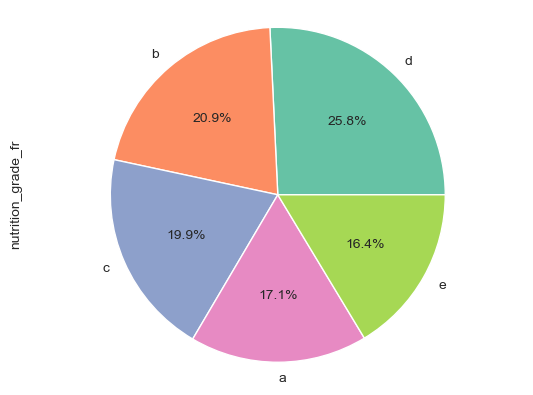

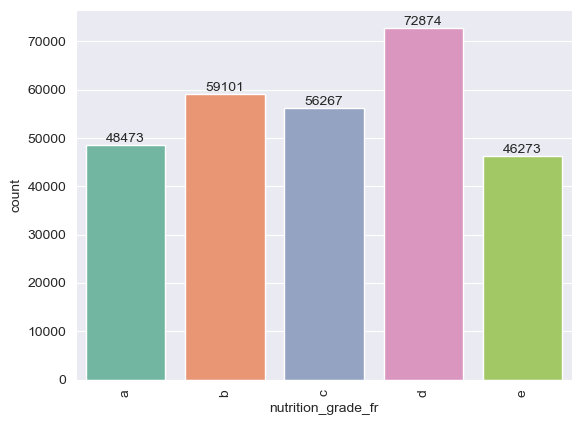

In [15]:
# Diagramme en secteurs
data["nutrition_grade_fr"].value_counts(normalize=True).plot(kind='pie', autopct='%1.1f%%')
# Cette ligne assure que le pie chart est un cercle plutôt qu'une éllipse
plt.axis('equal') 
plt.xticks
plt.show() # Affiche le graphique


# seaborn countplot
ax = sns.countplot(x='nutrition_grade_fr', data=data)
ax.bar_label(ax.containers[0])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

# <a name="C3">Analyses bivariées</a>
<a href="#C0">SOMMAIRE</a>

#### Regardons les compositions par type d'aliments par exemple

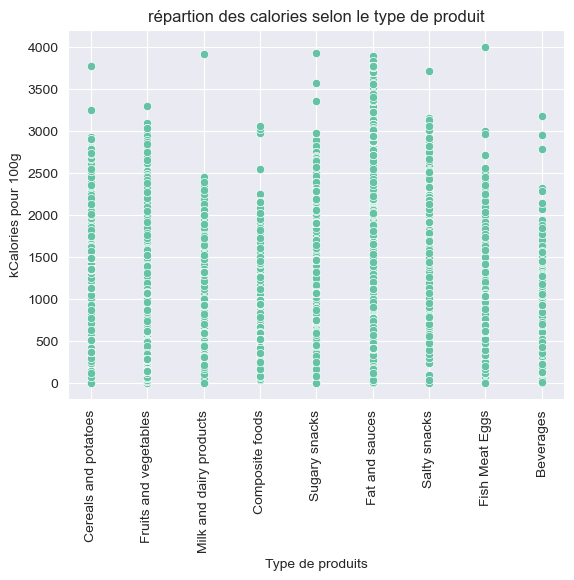

In [16]:
# exemple on regarde la répartion des calories selon le type de produit
sns.scatterplot(data=data,x='pnns_groups_1',y='energy_100g')
plt.xticks(rotation = 90)
plt.xlabel('Type de produits')
plt.ylabel('kCalories pour 100g')
plt.title('répartion des calories selon le type de produit')
plt.show()

Peu précis, donc on va essayer de faire autrement

In [17]:
#liste des variables qu'on veut étudier
listvar=['energy_100g'  ,'fat_100g','saturated_fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g',
         'salt_100g','sodium_100g','nutrition_score_fr_100g','nutriscore']
#liste des catégories qu'on peut identifier
categs=['Cereals and potatoes', 'Fruits and vegetables',
       'Milk and dairy products', 'Composite foods', 'Sugary snacks',
       'Fat and sauces', 'Salty snacks', 'Fish Meat Eggs', 'Beverages']
nutriscores=data['nutrition_grade_fr'].unique()

In [18]:
#beaucoup trop global ne nous donne pas assez d'info
data.describe()
    

,additives_n,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,246999.000000,282988.000000,282988.000000,282988.000000,282988.000000,282988.000000,282988.000000,282988.000000,282988.000000,282988.000000,282988.000000
mean,1.937728,1095.975990,12.320112,4.933942,30.965515,15.466224,2.579239,6.973021,1.516402,0.617150,9.228024
std,2.503701,784.807247,16.564853,7.229233,27.768167,20.058329,3.925484,7.959285,5.921136,2.518492,7.808132
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,368.000000,0.100000,0.000000,6.000000,1.530000,0.000000,0.700000,0.058000,0.023000,2.000000
50%,1.000000,1090.000000,6.700000,2.700000,24.000000,6.670000,2.000000,5.000000,0.609600,0.240000,8.000000
75%,3.000000,1644.000000,17.860000,6.000000,54.550000,20.000000,3.000000,10.000000,1.500000,0.590551,15.000000
max,31.000000,4000.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,40.000000


--------------------
Cereals and potatoes
moy:
 1325.659279834986
med:
 1479.0
mod:
 0    1356.376454
Name: energy_100g, dtype: float64
var:
 225945.9814834937
ect:
 475.3377551630984


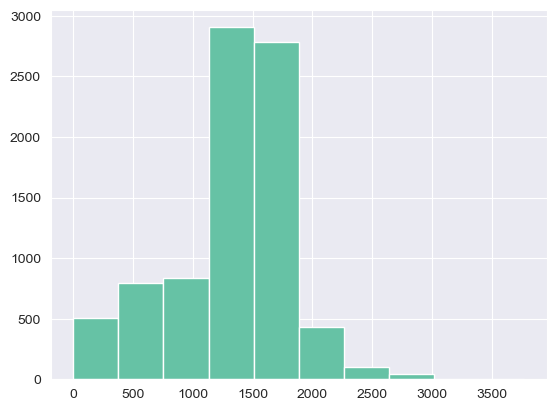

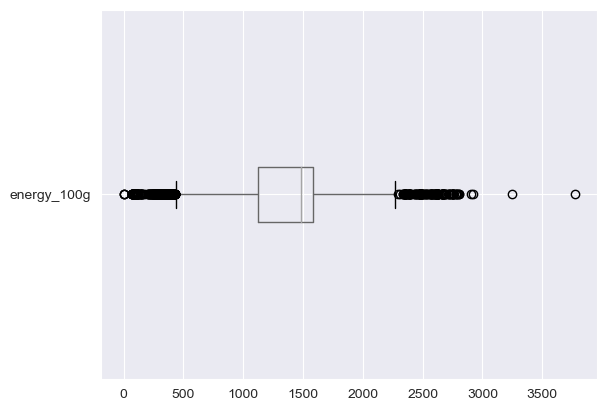

--------------------
Fruits and vegetables
moy:
 344.68775195765426
med:
 199.0
mod:
 0    134.290087
Name: energy_100g, dtype: float64
var:
 186551.31571521267
ect:
 431.91586647773505


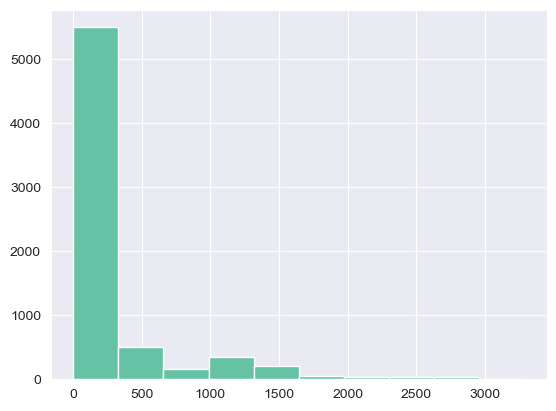

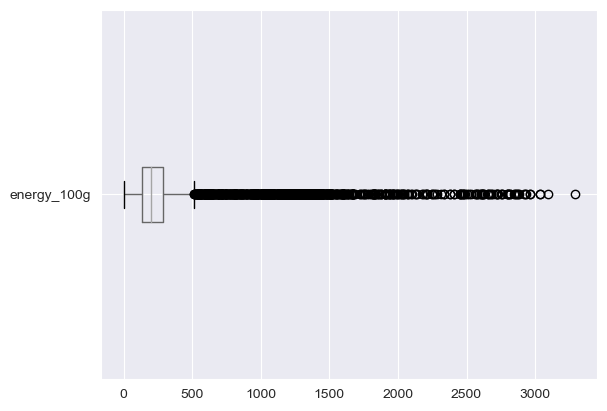

--------------------
Milk and dairy products
moy:
 838.2941444778221
med:
 769.5
mod:
 0    1314.811205
Name: energy_100g, dtype: float64
var:
 247935.40476717474
ect:
 497.9311245214289


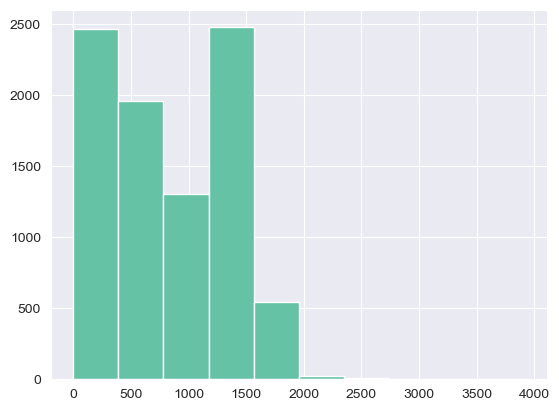

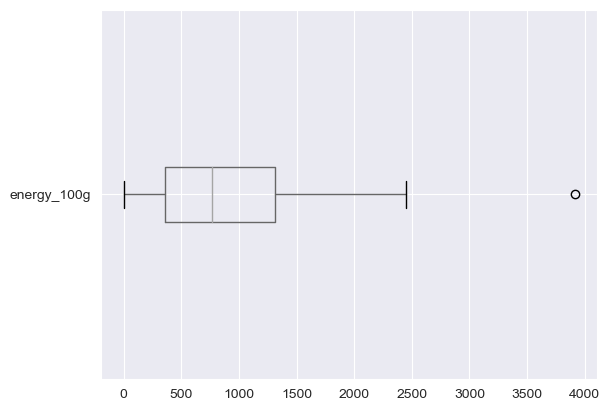

--------------------
Composite foods
moy:
 676.8528386592177
med:
 598.0
mod:
 0    515.133764
Name: energy_100g, dtype: float64
var:
 111360.50286442542
ect:
 333.7072112862193


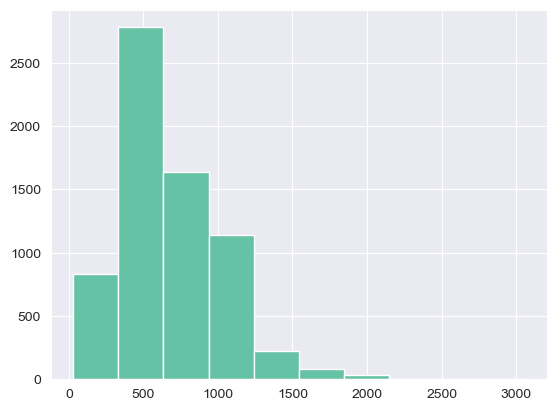

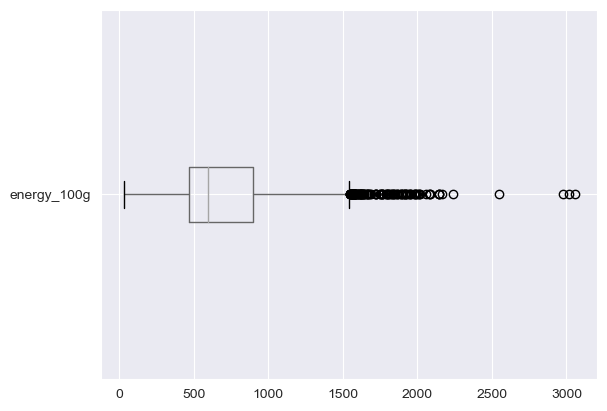

--------------------
Sugary snacks
moy:
 1759.008882950618
med:
 1903.438951595877
mod:
 0    1072.040704
Name: energy_100g, dtype: float64
var:
 263348.9374420365
ect:
 513.1753476561754


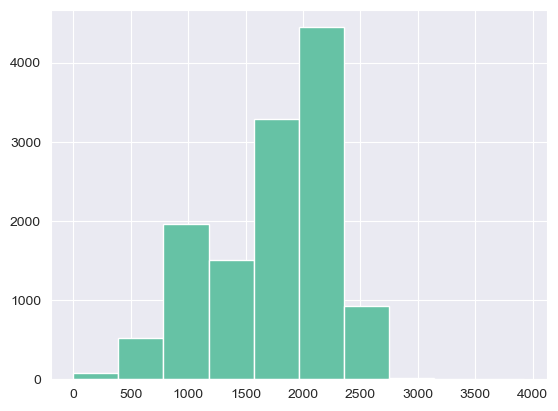

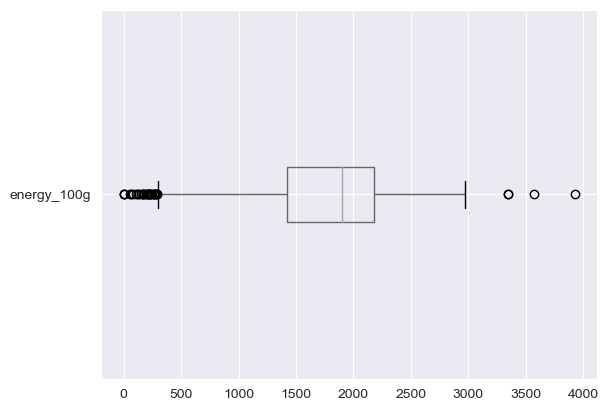

--------------------
Fat and sauces
moy:
 1501.486746384778
med:
 897.0
mod:
 0    410.570537
Name: energy_100g, dtype: float64
var:
 1555528.5281449528
ect:
 1247.2082938085975


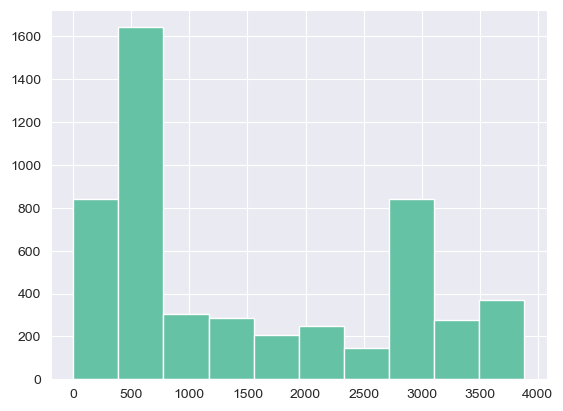

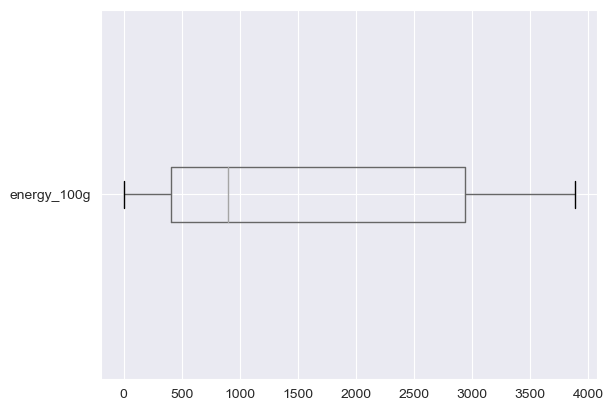

--------------------
Salty snacks
moy:
 2111.287568277933
med:
 2152.0
mod:
 0    1911.987934
Name: energy_100g, dtype: float64
var:
 176532.8548354232
ect:
 420.15813075010607


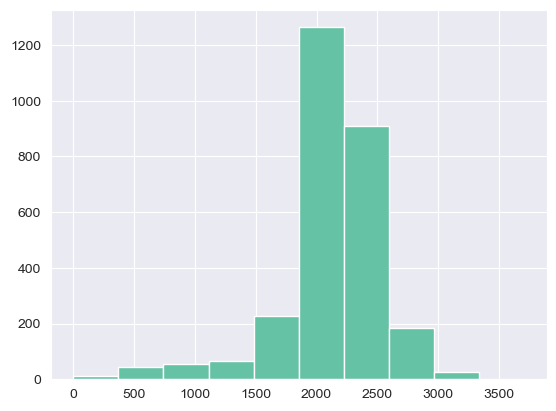

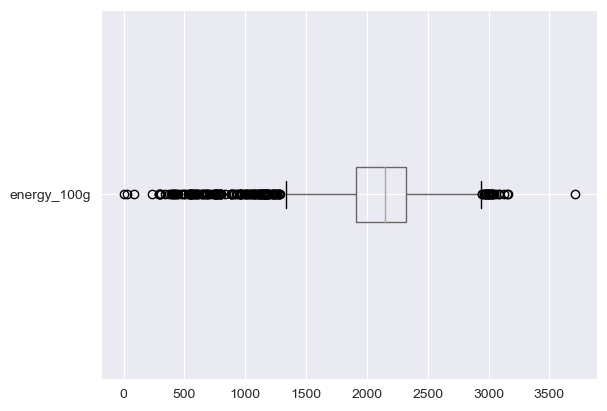

--------------------
Fish Meat Eggs
moy:
 839.5680553678161
med:
 713.0
mod:
 0    1033.758477
Name: energy_100g, dtype: float64
var:
 149761.48230192496
ect:
 386.99028708990227


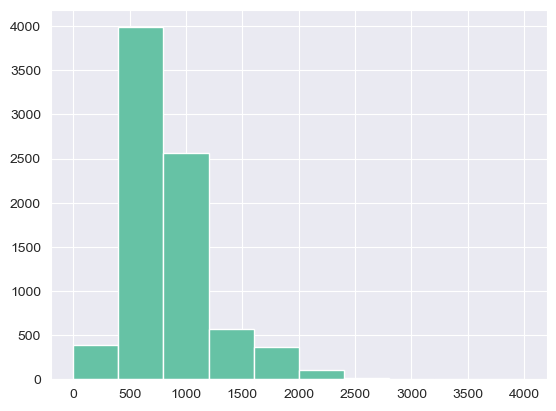

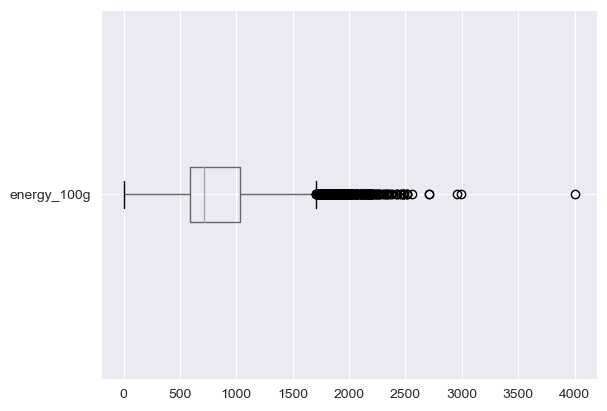

--------------------
Beverages
moy:
 228.22871107118152
med:
 163.0
mod:
 0    122.520588
Name: energy_100g, dtype: float64
var:
 94257.81896922814
ect:
 307.0143628060879


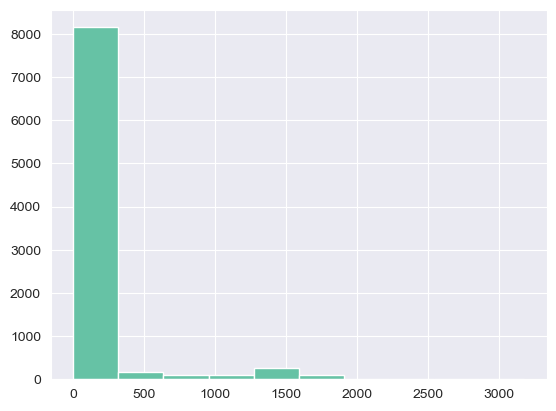

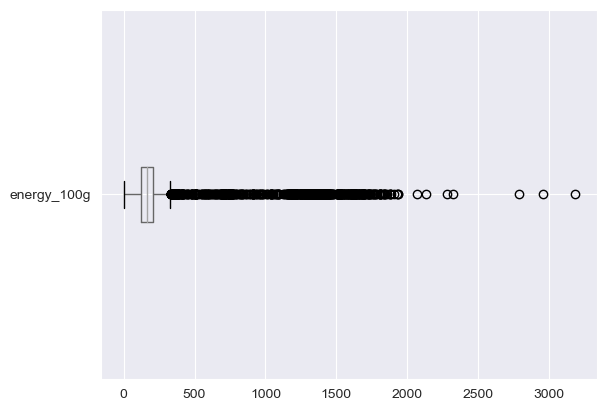

In [19]:
var='energy_100g'
for cat in categs :
    subset=data[data['pnns_groups_1']==cat]
    print("-"*20)
    print(cat)
    print("moy:\n",subset[var].mean())
    print("med:\n",subset[var].median())
    print("mod:\n",subset[var].mode())
    print("var:\n",subset[var].var(ddof=0))
    print("ect:\n",subset[var].std(ddof=0))
    subset[var].hist()
    plt.show()
    subset.boxplot(column=var, vert=False)
    plt.show()
    

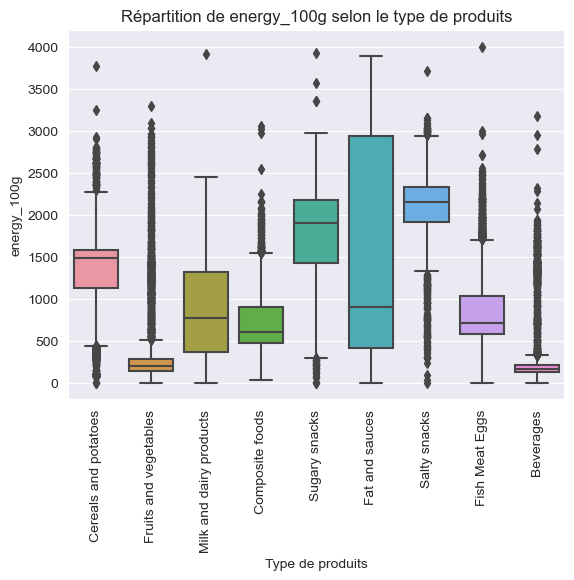

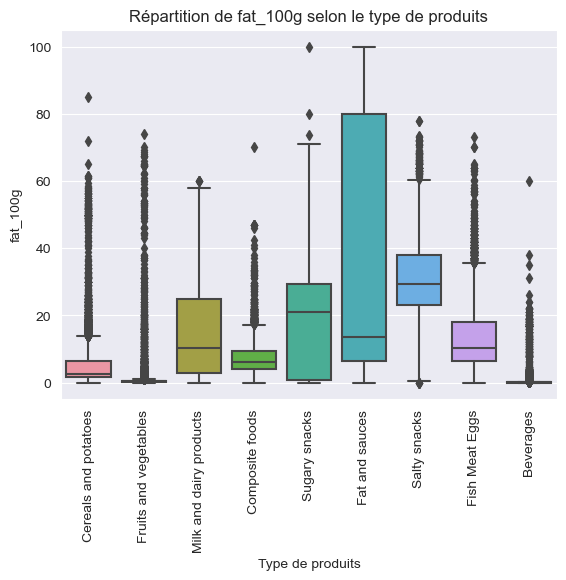

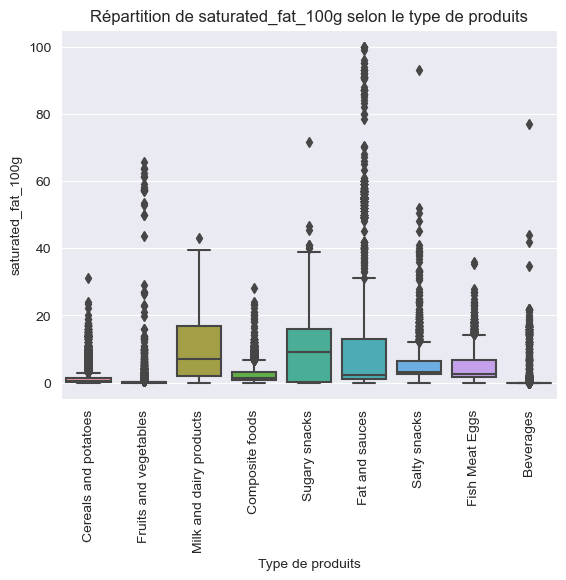

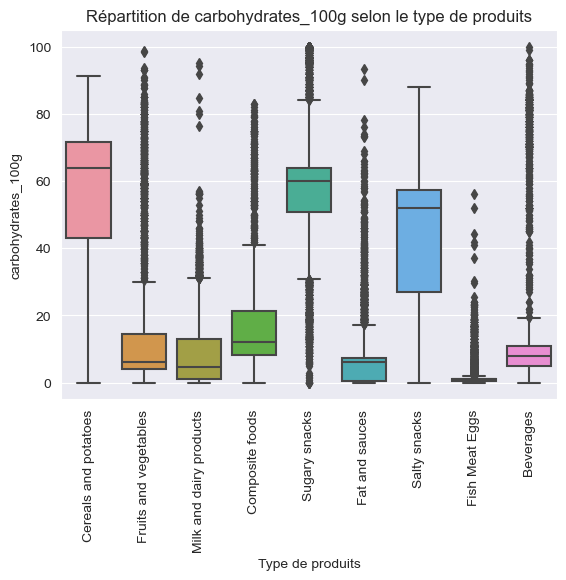

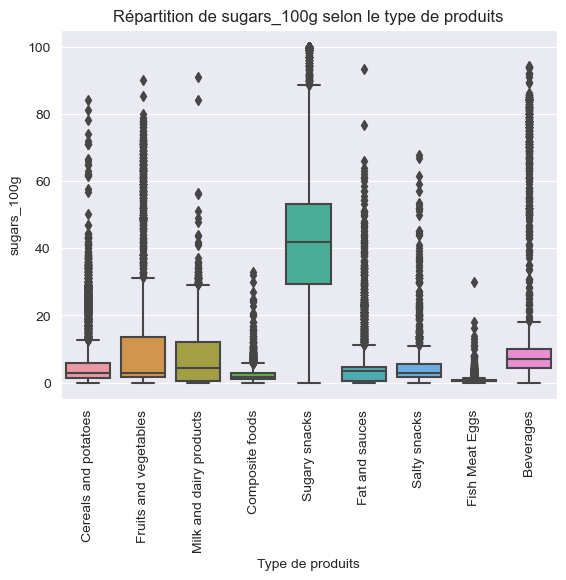

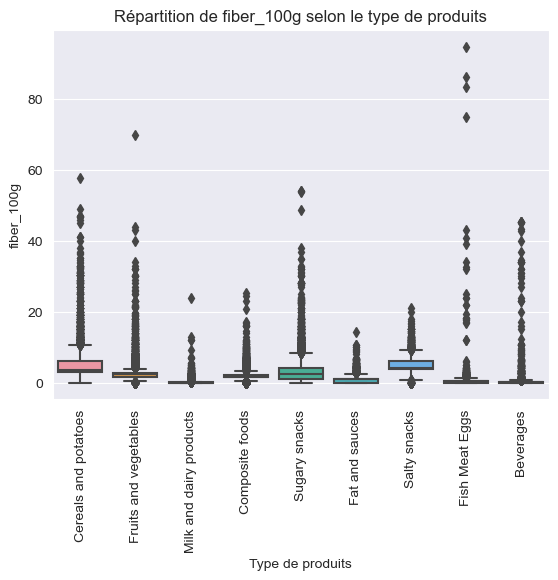

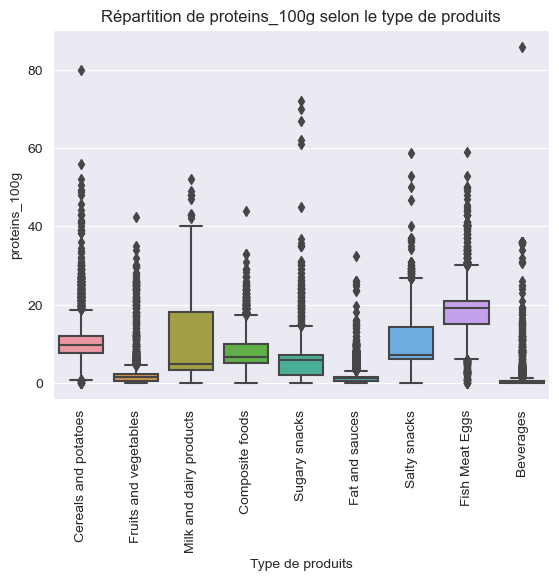

In [20]:
#ici on voit les caractéristiques des différents produits selon la catégorie
for var in ['energy_100g'  ,'fat_100g','saturated_fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g'] :
    sns.boxplot(data=data[data['pnns_groups_1'].notna()], x='pnns_groups_1', y=var)
    plt.xticks(rotation = 90)
    plt.xlabel('Type de produits')
    plt.ylabel(var)
    plt.title('Répartition de '+var+' selon le type de produits')
    plt.show()

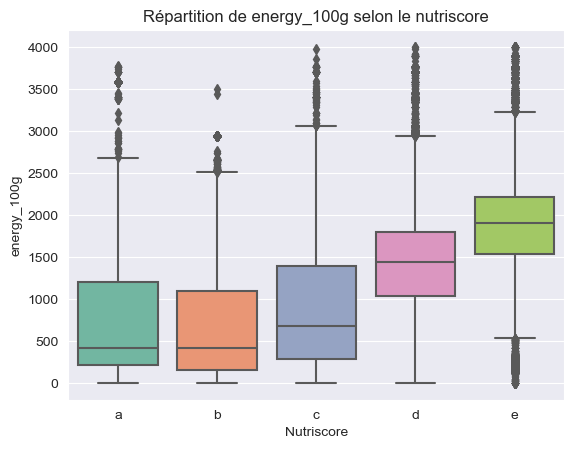

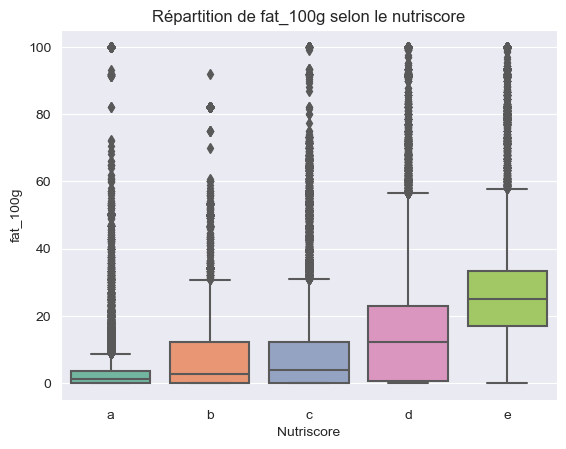

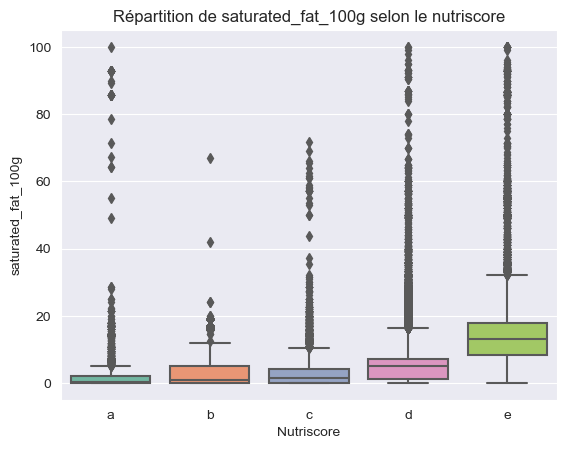

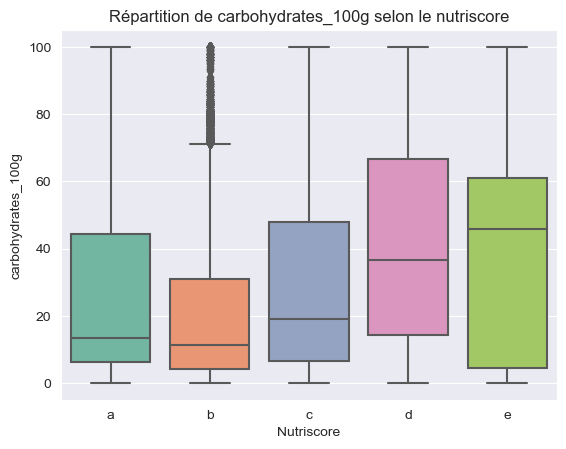

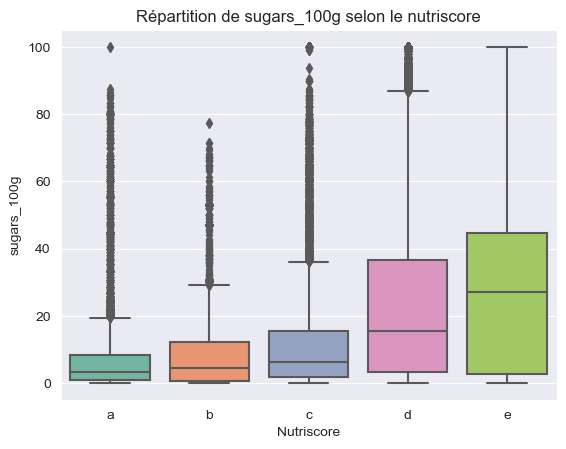

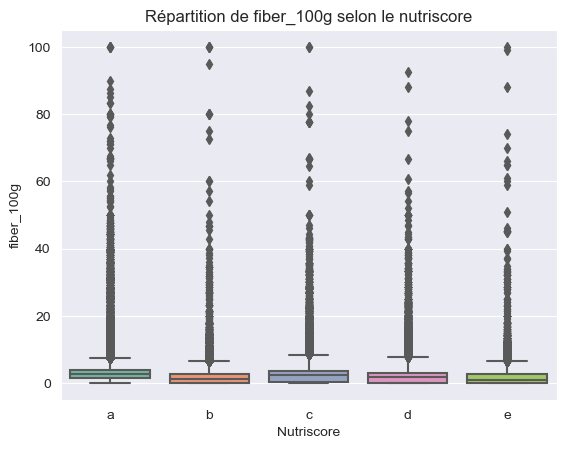

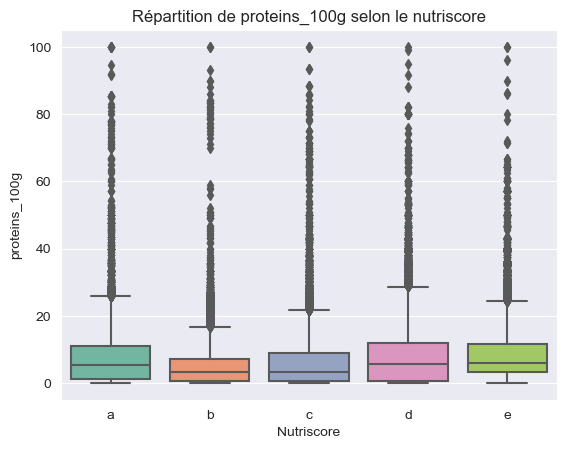

In [21]:
#maintenant nous allons regarder selon les différents nutriscore
for var in ['energy_100g'  ,'fat_100g','saturated_fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g'] :
    sns.boxplot(data=data, x='nutrition_grade_fr', y=var, order=np.sort(nutriscores))
    plt.xlabel('Nutriscore')
    plt.ylabel(var)
    plt.title('Répartition de '+var+' selon le nutriscore')
    plt.show()

## Corrélations

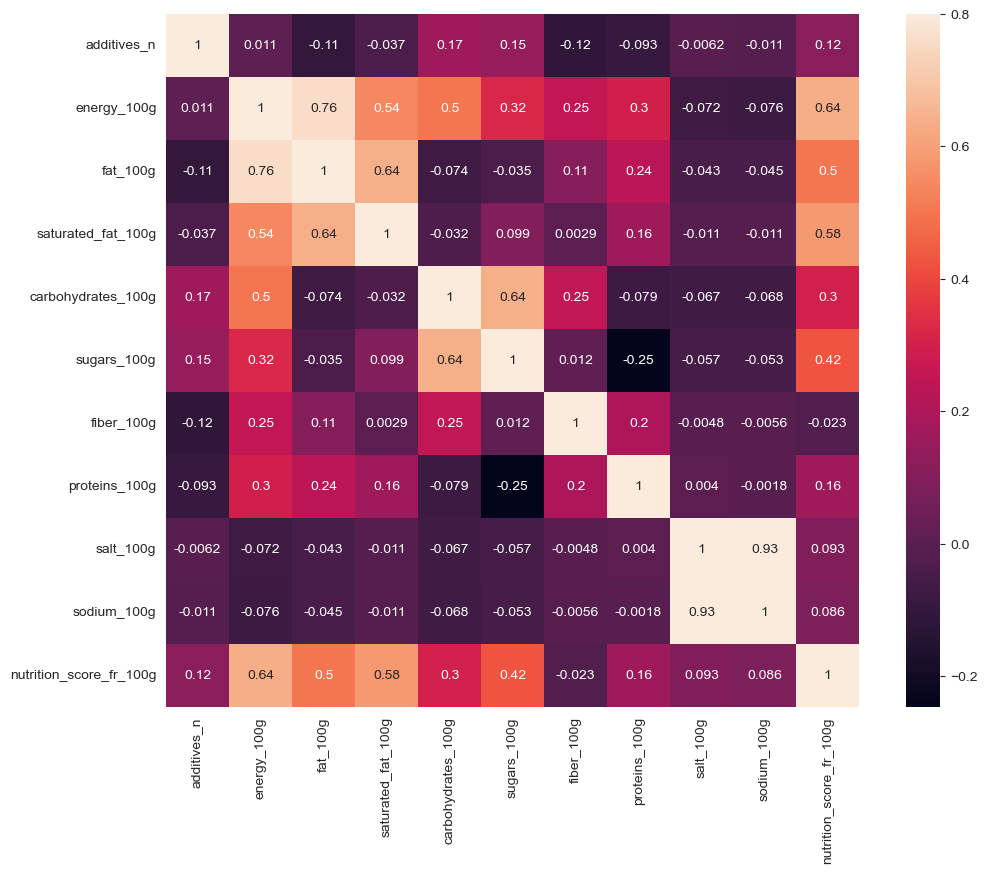

In [22]:
corrmat = data.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True,annot=True);

## Modélisation des calories en fonction de la compo

### Test avec le gras (pas si mal)

In [23]:
import statsmodels.api as sm
Y = data['energy_100g']
X = data[['fat_100g']]
X = X.copy() # On modifiera X, on en crée donc une copie
X['intercept'] = 1.
result = sm.OLS(Y, X).fit() # OLS = Ordinary Least Square (Moindres Carrés Ordinaire)
a,b = result.params['fat_100g'],result.params['intercept']

In [24]:
print('droite de régression energy_100g en fonction de fat_100g')
print('y=',a,'x + ',b)

droite de régression energy_100g en fonction de fat_100g
y= 36.00885467019876 x +  652.3428796071579


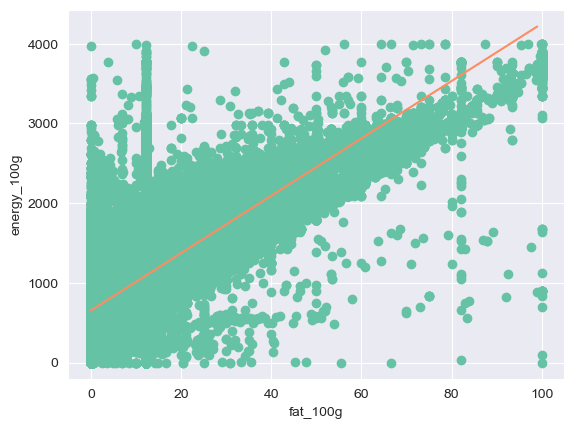

In [25]:
plt.plot(data.fat_100g,data.energy_100g, "o")
plt.plot(np.arange(100),[a*x+b for x in np.arange(100)])
plt.xlabel("fat_100g")
plt.ylabel("energy_100g")
plt.show()

In [26]:
from sklearn.metrics import r2_score
#évaluation du modèle
actual_values=data.energy_100g
predicted_values=data.apply(lambda row: a*row.fat_100g + b, axis=1)
r2_fat = r2_score(actual_values, predicted_values)
print('r2 score for fat model :', r2_fat)

r2 score for fat model : 0.5776539589694456


### Test avec le sucre (non concluant)

In [27]:
Y_ = data['energy_100g']
X_ = data[['sugars_100g']]
X_ = X_.copy() # On modifiera X, on en crée donc une copie
X_['intercept'] = 1.
result = sm.OLS(Y_, X_).fit() # OLS = Ordinary Least Square (Moindres Carrés Ordinaire)
c,d = result.params['sugars_100g'],result.params['intercept']

In [28]:
print('droite de régression energy_100g en fonction de sugars_100g')
print('y=',c,'x + ',d)

droite de régression energy_100g en fonction de sugars_100g
y= 12.433931708226991 x +  903.67001889272


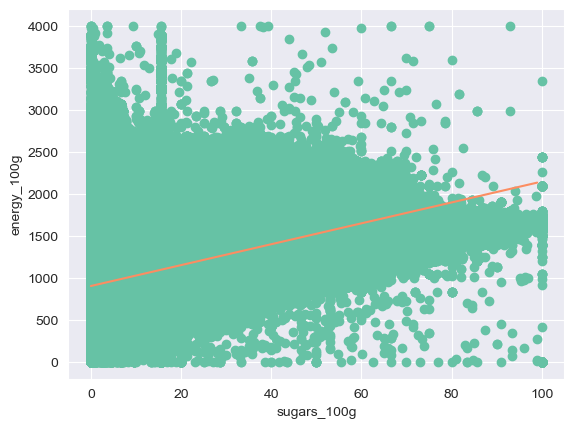

In [29]:
plt.plot(data.sugars_100g,data.energy_100g, "o")
plt.plot(np.arange(100),[c*x+d for x in np.arange(100)])
plt.xlabel("sugars_100g")
plt.ylabel("energy_100g")
plt.show()

In [30]:
#évaluation du modèle
actual_values=data.energy_100g
predicted_values=data.apply(lambda row: c*row.sugars_100g + d, axis=1)
r2_sugars = r2_score(actual_values, predicted_values)
print('r2 score for sugars model :', r2_sugars)

r2 score for sugars model : 0.10099048497771024


### Régression multiple avec fat et sucre combiné

In [31]:
import statsmodels.api as sm

# Ajouter les variables indépendantes taux de gras et de sucre
X = data[['fat_100g', 'sugars_100g']]
X = X.copy() # On modifiera X, on en crée donc une copie
X['intercept'] = 1.

# Entraîner le modèle de régression multiple
Y = data['energy_100g']
result = sm.OLS(Y, X).fit()

# Récupérer les coefficients
params = result.params
a, b, c = params['fat_100g'], params['sugars_100g'], params['intercept']
print('Droite de régression energy_100g en fonction de fat_100g et sugars_100g : y =', a, 'x1 +', b, 'x2 +', c)



Droite de régression energy_100g en fonction de fat_100g et sugars_100g : y = 36.579087992845835 x1 + 13.48857372936322 x2 + 436.7002402686545


Score R2 pour le modèle : 0.6963581054292352


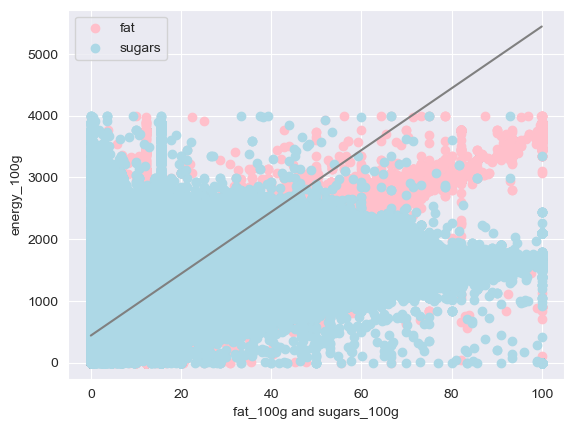

In [32]:
# Évaluer le modèle
actual_values = data.energy_100g
predicted_values = data.apply(lambda row: a*row.fat_100g + b*row.sugars_100g + c, axis=1)
r2 = r2_score(actual_values, predicted_values)
print('Score R2 pour le modèle :', r2)

# Tracé de la régression multiple
plt.scatter(data['fat_100g'], data['energy_100g'], color='pink')
plt.scatter(data['sugars_100g'], data['energy_100g'], color='lightblue')

# Tracé de la droite de régression
x_vals = np.linspace(0, 100, 100)
y_vals = a * x_vals + b * x_vals + c
plt.plot(x_vals, y_vals, color='gray')

plt.xlabel("fat_100g and sugars_100g")
plt.ylabel("energy_100g")
plt.legend(['fat', 'sugars'], loc='upper left')
plt.show()


### Questions à se poser en vue d'analyse ANOVA :
Nutriscore mauvais = calorique ?
est ce pnn groupe => calorique ou nutriscore lié

In [33]:
data.columns

Index(['code', 'url', 'product_name', 'brands', 'countries', 'countries_tags',
       'countries_fr', 'ingredients_text', 'additives_n', 'additives',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'main_category_fr', 'nutriscore'],
      dtype='object')

#### Calories en fonction des catégories

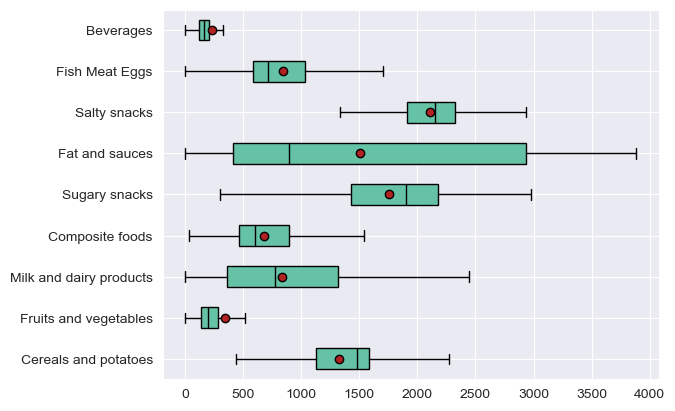

In [34]:
C = "pnns_groups_1" # qualitative
E = "energy_100g" # quantitative

# On n'étudie pas les produits quand la catégorie est inconnue
dfss = data[data[C] != "unknown"] 
modalites = categs
groupes = []
for m in modalites:
    groupes.append(dfss[dfss[C]==m][E])

# Propriétés graphiques (pas très importantes)    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

#### Nutriscore en fonction des catégories

In [35]:
data.columns

Index(['code', 'url', 'product_name', 'brands', 'countries', 'countries_tags',
       'countries_fr', 'ingredients_text', 'additives_n', 'additives',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'main_category_fr', 'nutriscore'],
      dtype='object')

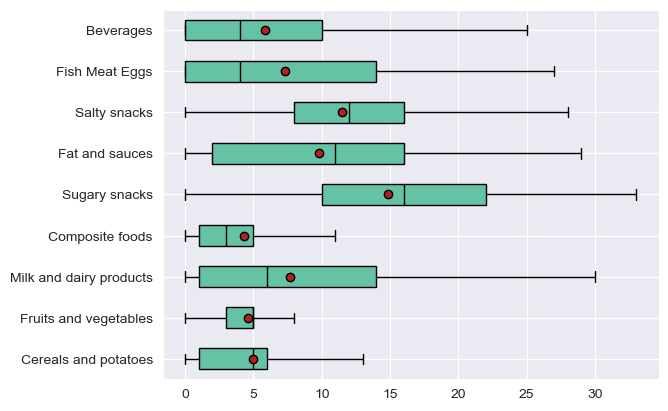

In [36]:
C = "pnns_groups_1" # qualitative
NS = "nutrition_score_fr_100g" # quantitative

# On n'étudie pas les produits quand la catégorie est inconnue
sous_echantillon = data[data[C] != "unknown"] 
modalites = categs
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[C]==m][NS])

# Propriétés graphiques (pas très importantes)    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

#### Calories en fonction du nutriscore 

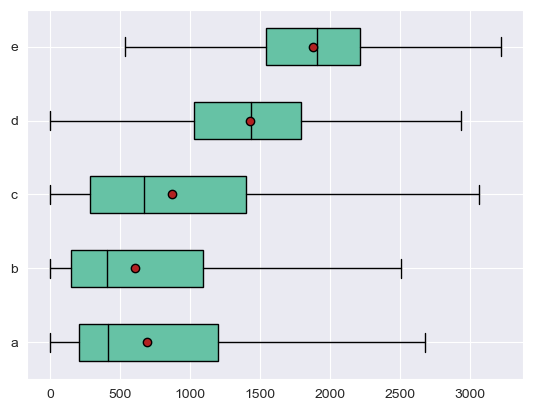

In [37]:
NG = "nutrition_grade_fr" # qualitative
E = "energy_100g" # quantitative

modalites = nutriscores.sort_values()
groupes = []
for m in modalites:
    groupes.append(data[data[NG]==m][E])

# Propriétés graphiques (pas très importantes)    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

In [38]:
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

### ETUDE DE CORRELATION avec le rapport de corrélation / eta carré / eta squared
Pour rappel
C = "pnns_groups_1" # qualitative
NS = "nutrition_score_fr_100g" # quantitative
NG = "nutrition_grade_fr" # qualitative
E = "energy_100g" # quantitative

In [39]:
datadropnocateg = data[data['pnns_groups_1'].notna()]
print('Rapport de corrélation entre la catégorie et les calories : ',eta_squared(datadropnocateg[C],datadropnocateg[E]))
print('Rapport de corrélation entre la catégorie et le nutrition score',eta_squared(datadropnocateg[C],datadropnocateg[NS]))
print('Rapport de corrélation entre le nutrition grade et les calories',eta_squared(data[NG],data[E]))

Rapport de corrélation entre la catégorie et les calories :  0.5271210947028765
Rapport de corrélation entre la catégorie et le nutrition score 0.23468014292309974
Rapport de corrélation entre le nutrition grade et les calories 0.3516177400047242


## Analyser deux variables qualitatives

### à la mano

nutrition_grade_fr,a,b,c,d,e,TotalCateg
pnns_groups_1,,,,,,
Beverages,6.61,36.55,21.19,11.52,24.13,100.0
Cereals and potatoes,48.08,21.66,18.28,10.49,1.49,100.0
Composite foods,22.81,36.39,25.16,14.32,1.32,100.0
Fat and sauces,4.09,25.14,19.99,34.94,15.84,100.0
Fish Meat Eggs,9.01,35.47,19.90,21.48,14.14,100.0
Fruits and vegetables,46.72,11.57,40.04,1.37,0.31,100.0
Milk and dairy products,10.70,27.65,20.40,37.08,4.17,100.0
Salty snacks,7.31,10.43,24.66,43.94,13.66,100.0
Sugary snacks,1.36,18.86,7.17,30.98,41.63,100.0


<AxesSubplot:xlabel='nutrition_grade_fr', ylabel='pnns_groups_1'>

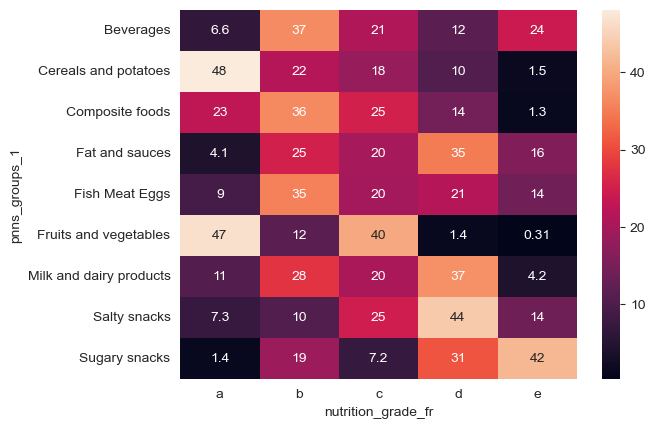

In [40]:
nutri_categ = pd.pivot_table(data, values='code', index='pnns_groups_1', columns='nutrition_grade_fr', 
                             aggfunc='count', fill_value=None, margins=False, dropna=True)
nutri_categ['TotalCateg']=nutri_categ.sum(axis=1)
for col in nutri_categ.columns :
    nutri_categ[col]=round(nutri_categ[col]/nutri_categ['TotalCateg']*100,2)
display(nutri_categ)
sns.heatmap(nutri_categ.drop('TotalCateg',axis=1),annot=True)

### via la méthode du cours

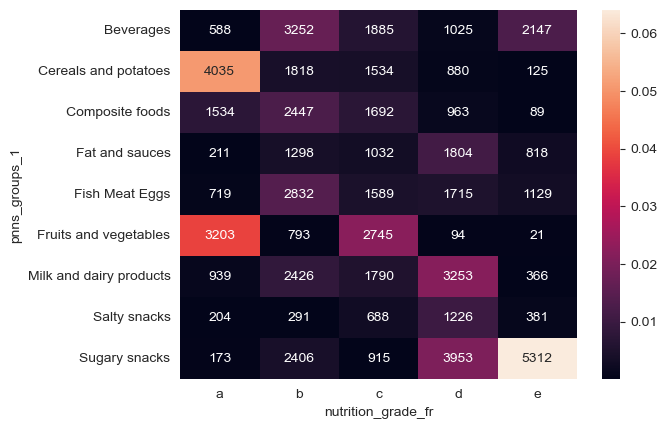

In [41]:
X = "pnns_groups_1"
Y = "nutrition_grade_fr"


cont = data[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont
tx = cont.loc[:,["Total"]]
ty = cont.loc[["Total"],:]
n = len(data)
indep = tx.dot(ty) / n

c = cont.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n
sns.heatmap(table.iloc[:-1,:-1],annot=c.iloc[:-1,:-1],fmt='g')
plt.show()

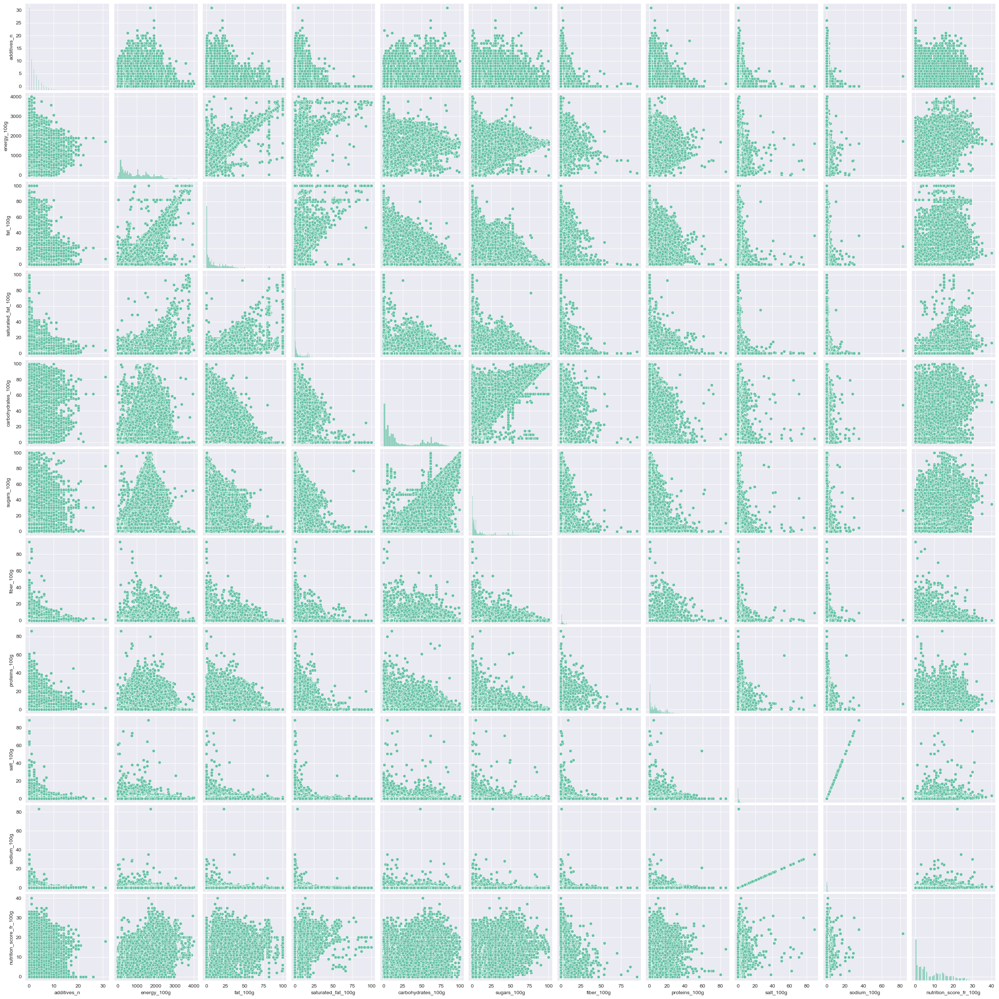

In [42]:
dfpair=data[data['pnns_groups_1'].notnull()]
sns.pairplot(dfpair)

# <a name="C4">Analyses multivariées</a>
<a href="#C0">SOMMAIRE</a>

# ACP / Réduction dimensionnelle

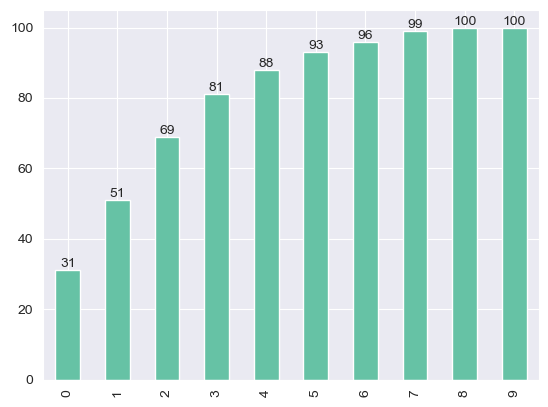

In [43]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
sc=StandardScaler()
# X = données à utiliser pour l'ACP
cols_to_use = ['energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g']
X = data[cols_to_use].values
Xstd=sc.fit_transform(X)
#trouvons le nombre idéal de composantes à utiliser
pcamax = PCA(n_components=X.shape[1])
Xpca=pcamax.fit_transform(Xstd)
#on construit l'éboulis des valeurs propres SCREE
scree=pcamax.explained_variance_ratio_
scree_cum=np.cumsum(scree)
ax=pd.Series(np.round(scree_cum,2)*100).plot(kind='bar') 
ax.bar_label(ax.containers[0])
plt.show()

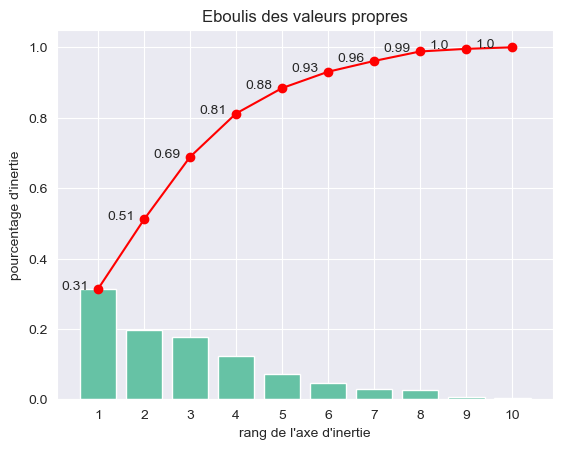

In [44]:
#méthode du cours
x_list=range(1,pcamax.n_components+1)
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.xticks(x_list)
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
for i,j in zip(x_list,scree_cum):
    plt.annotate(str(round(j,2)),xy=(i-0.8,j))
plt.show(block=False)

Nous allons donc choisir **5 composantes**.

In [45]:
display(pd.DataFrame(Xstd).describe().round(2).loc[["mean", "std"], :])

,0,1,2,3,4,5,6,7,8,9
mean,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


C:\Users\Me\AppData\Local\Temp\ipykernel_7420\42764003.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


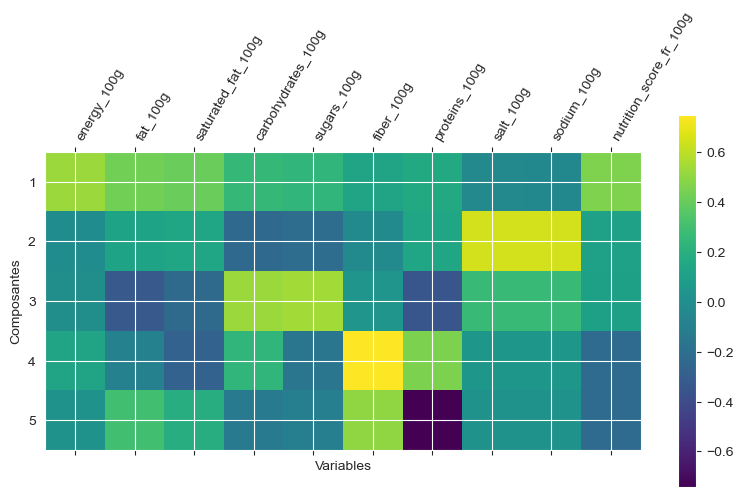

In [46]:
# Initialiser et entraîner l'ACP
pca = PCA(n_components=5)
Xstd=sc.fit_transform(X)
X_transformed = pca.fit(Xstd)

# Obtenir les vecteurs propres
vectors = pca.components_

# Afficher les vecteurs propres
plt.matshow(vectors, cmap='viridis')
plt.yticks(range(pca.n_components), range(1,6))
plt.colorbar()
plt.xticks(range(len(cols_to_use)), cols_to_use, rotation=60, ha='left')
plt.xlabel("Variables")
plt.ylabel("Composantes")
plt.tight_layout()
plt.show()


In [47]:
F = pca.components_
#affichons les vecteurs propres
for i in range(pca.n_components):
    print("\n F" + str(i+1) + " :", np.around(F[i], 2))



 F1 : [ 0.53  0.43  0.41  0.25  0.24  0.13  0.16 -0.04 -0.04  0.46]

 F2 : [-0.02  0.12  0.13 -0.24 -0.21 -0.04  0.13  0.65  0.65  0.11]

 F3 : [-0.   -0.33 -0.23  0.52  0.54  0.03 -0.34  0.26  0.27  0.1 ]

 F4 : [ 0.13 -0.09 -0.27  0.24 -0.16  0.75  0.45  0.05  0.05 -0.22]

 F5 : [ 0.02  0.3   0.19 -0.13 -0.1   0.5  -0.74  0.02  0.03 -0.22]


In [48]:
products=data[cols_to_use].index
features =data[cols_to_use].columns
print('\n Products : ', products, '\n Features : ',features)


 Products :  Int64Index([     0,      1,      2,      3,      4,      5,      6,      7,
                 9,     10,
            ...
            281923, 282940, 282941, 282943, 282944, 282945, 282947, 282948,
            282955, 282958],
           dtype='int64', length=282988) 
 Features :  Index(['energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g'],
      dtype='object')


In [49]:
pcs = pd.DataFrame(F)
pcs.columns = features
x_list=range(1,pca.n_components+1)
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
F1,0.53,0.43,0.41,0.25,0.24,0.13,0.16,-0.04,-0.04,0.46
F2,-0.02,0.12,0.13,-0.24,-0.21,-0.04,0.13,0.65,0.65,0.11
F3,-0.00,-0.33,-0.23,0.52,0.54,0.03,-0.34,0.26,0.27,0.10
F4,0.13,-0.09,-0.27,0.24,-0.16,0.75,0.45,0.05,0.05,-0.22
F5,0.02,0.30,0.19,-0.13,-0.10,0.50,-0.74,0.02,0.03,-0.22


In [50]:
pcs.T.round(2)

,F1,F2,F3,F4,F5
energy_100g,0.53,-0.02,-0.00,0.13,0.02
fat_100g,0.43,0.12,-0.33,-0.09,0.30
saturated_fat_100g,0.41,0.13,-0.23,-0.27,0.19
carbohydrates_100g,0.25,-0.24,0.52,0.24,-0.13
sugars_100g,0.24,-0.21,0.54,-0.16,-0.10
fiber_100g,0.13,-0.04,0.03,0.75,0.50
proteins_100g,0.16,0.13,-0.34,0.45,-0.74
salt_100g,-0.04,0.65,0.26,0.05,0.02
sodium_100g,-0.04,0.65,0.27,0.05,0.03
nutrition_score_fr_100g,0.46,0.11,0.10,-0.22,-0.22


<AxesSubplot:>

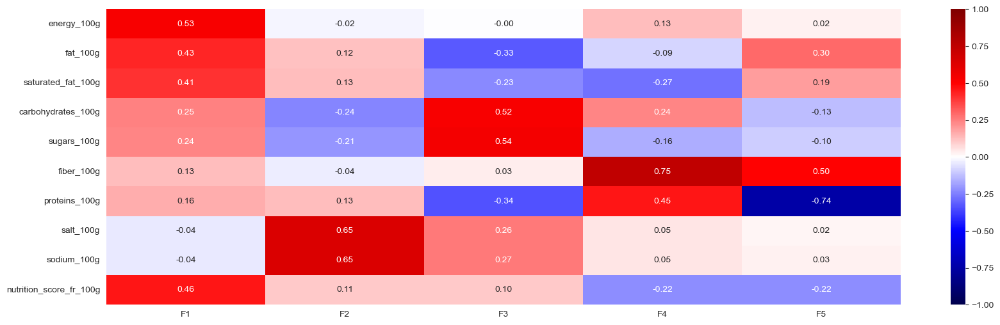

In [51]:
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="seismic", fmt="0.2f")

__________________________________________________________________________________________________________________________
**Cercle des Corrélations**

In [52]:
 pca.components_.shape

(5, 10)

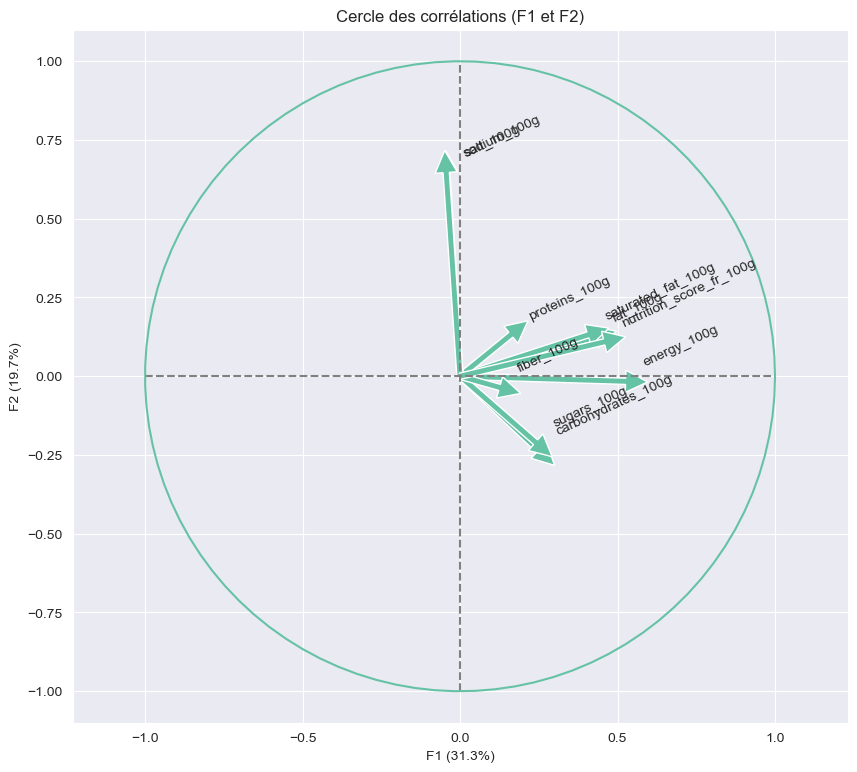

In [53]:
#initialisation
x, y = 0,1

#le graph
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.02,              )

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             features[i], rotation=25)
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.show(block=False)

Intuition F1 mesure si cela se mange et est consitant par exemple ( exemple boisson VS aliment ?) F1 mesure la consistance
F2 .. le sel ?

In [54]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

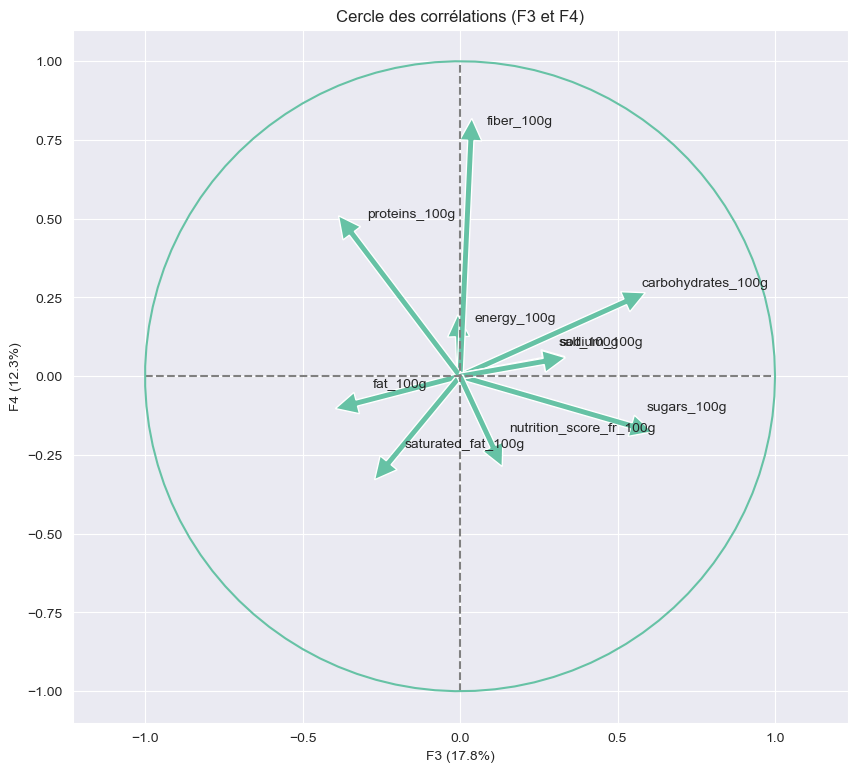

In [55]:
correlation_graph(pca,(2,3),features)

intuition : F4 va placer plutot les légumineuses  ? Riches en protérines et en fibre
F3 la concistance liquide à gauche solide à droite ?

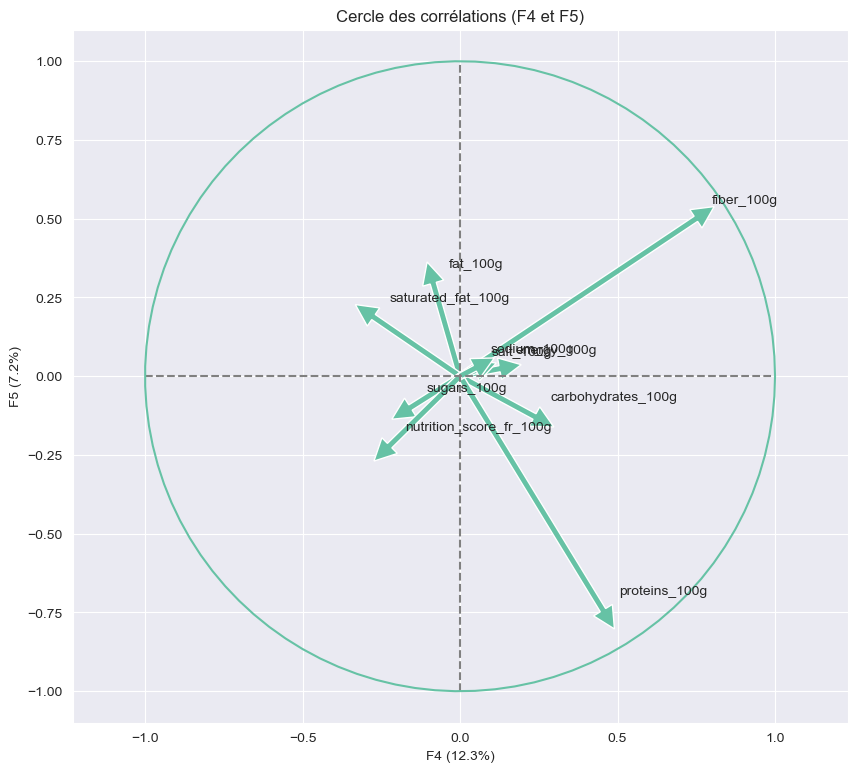

In [56]:
correlation_graph(pca,(3,4),features)

Intuition pour F5 => Animal en bas , végétal en haut 

In [57]:
# Projetons les individus dans le nouvel espace pour infirmer ou confirmer nos hypothèses
X_proj = pca.transform(Xstd)
X_proj[:10]

array([[-1.66315405, -0.4261457 , -0.09695785, -0.46397274,  0.37494089],
       [-1.89189851, -0.21063805, -0.5267446 , -0.18926736,  0.30114585],
       [-0.00876912, -0.68860754,  0.41174704,  1.34667382, -0.76227902],
       [-2.03605493, -0.2229652 , -0.43578728, -0.60002639,  0.29682961],
       [ 0.73156365,  0.91056429, -2.00914798, -0.49737297, -0.91474758],
       [-1.8994415 , -0.12463633, -0.36988111, -0.28328211,  0.51750183],
       [ 0.77865027, -0.37800214,  0.56676576, -0.15917998,  0.13749113],
       [-1.96186951, -0.20689453, -0.66688538, -0.56038567,  0.1463471 ],
       [ 2.17640873, -0.39232192,  0.19990492,  1.03864745,  0.49804866],
       [ 3.63335697,  0.09594651, -0.70946294,  0.54056749,  1.59907946]])

In [58]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()

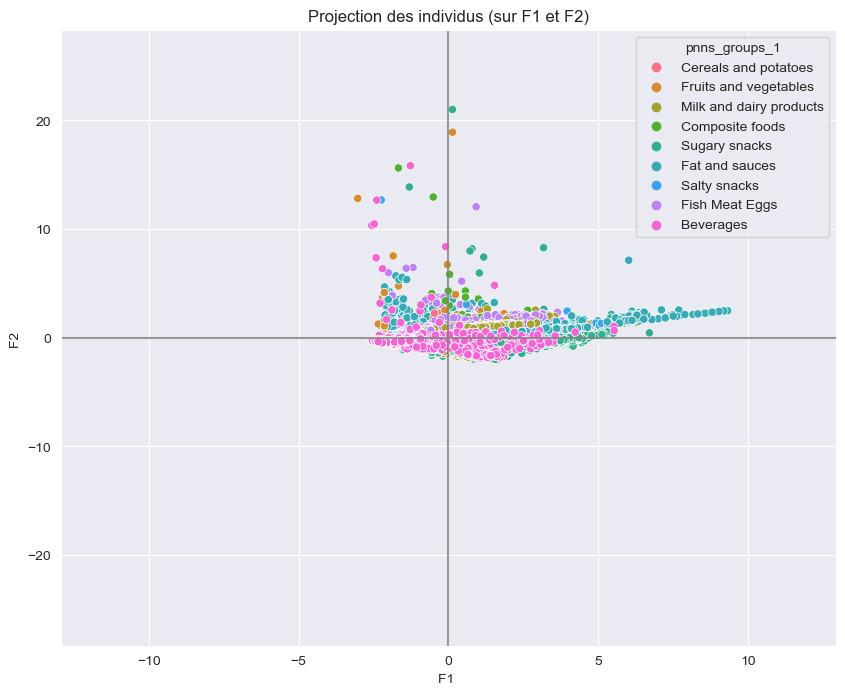

In [59]:
display_factorial_planes(X_proj, (0,1), clusters=data['pnns_groups_1'])

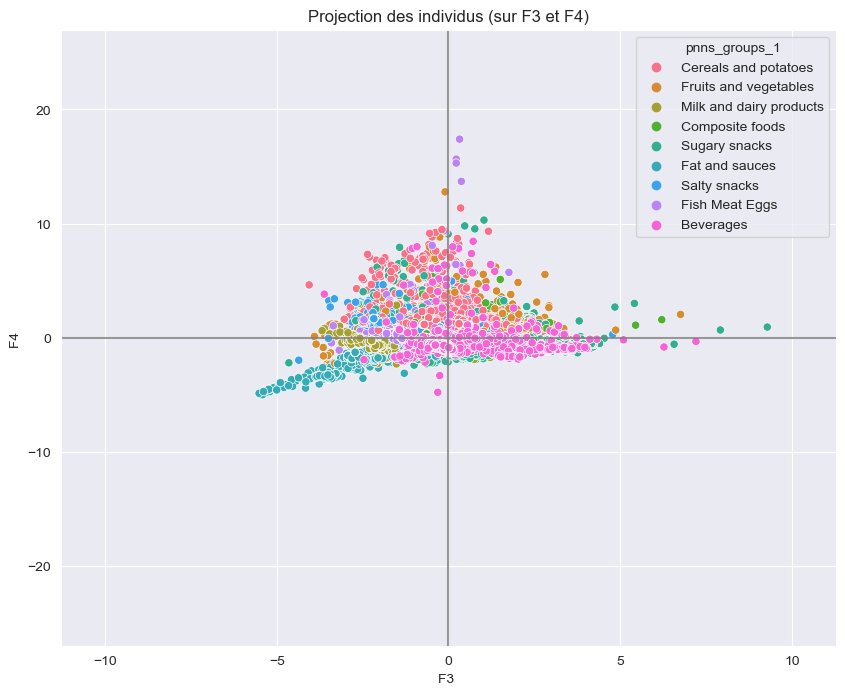

In [60]:
#j'ai du mal à infirmer ou affirmer mes hypothèses... F2 les boissons sont en bas donc finalement c'était peut etre ca la concistance
display_factorial_planes(X_proj, (2,3), clusters=data['pnns_groups_1'])

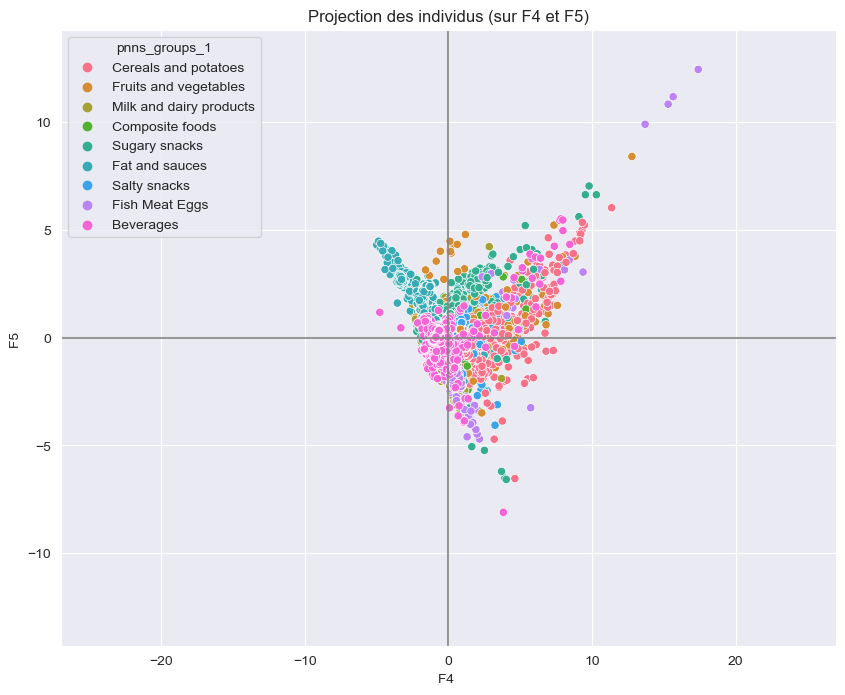

In [61]:
display_factorial_planes(X_proj, (3,4), clusters=data['pnns_groups_1'])

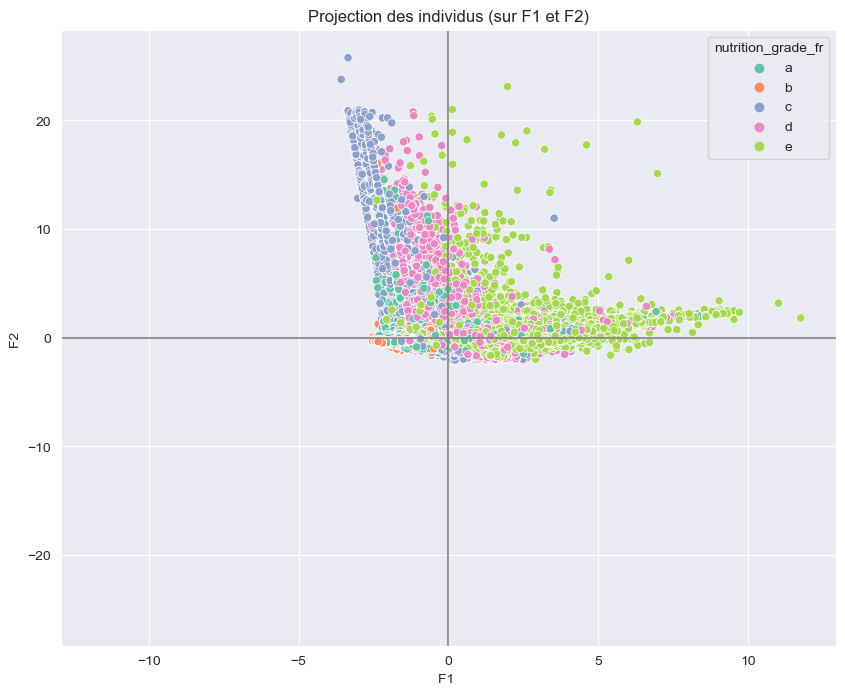

In [62]:
display_factorial_planes(X_proj, (0,1), clusters=data['nutrition_grade_fr'])

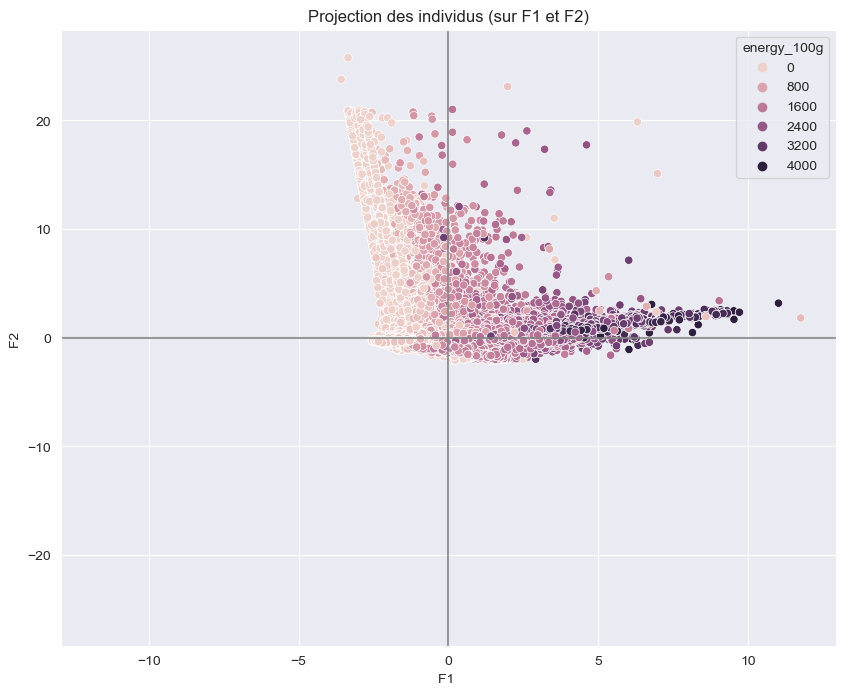

In [64]:
display_factorial_planes(X_proj, (0,1), clusters=data['energy_100g'])

# <a name="C5"> Partition ? Clustering et Clustering x ACP</a>
<a href="#C0">SOMMAIRE</a>

In [65]:
from sklearn.cluster import KMeans

In [66]:
Xdf=pd.DataFrame(X)
Xdf.columns=features
inertia_list=[]
k_list=range(1,10)
for k in k_list :
    kmeans=KMeans(n_clusters=k,n_init='auto')
    kmeans.fit(Xdf)
    inertia_list.append(kmeans.inertia_)

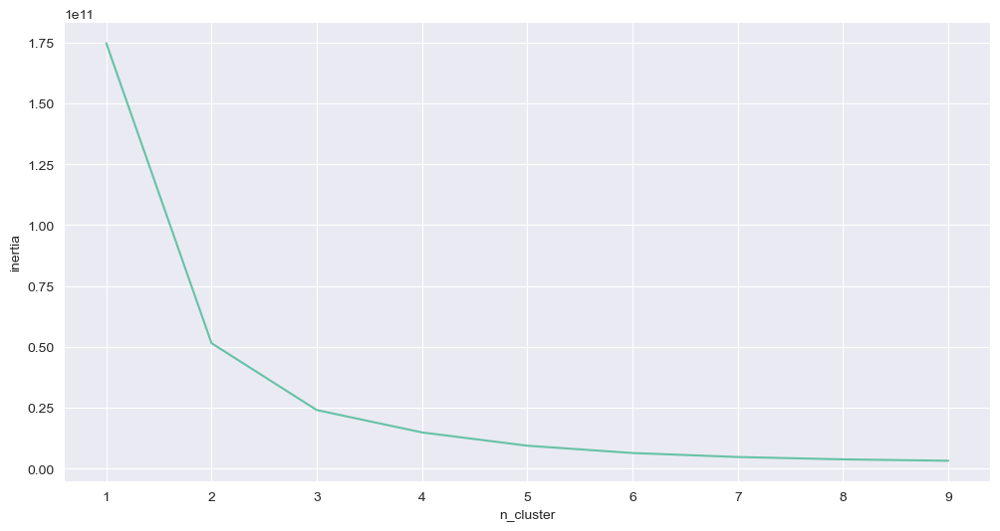

In [67]:
fig, ax = plt.subplots(1,1,figsize=(12,6))

ax.set_ylabel("inertia")
ax.set_xlabel("n_cluster")

ax = plt.plot(k_list, inertia_list)

In [68]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(Xdf)

C:\Users\Me\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=3)

In [69]:
dd = {i:j for i,j in enumerate(list("abc"))}
labels = [dd[i] for i in kmeans.labels_]
Xdf["cluster"] = labels


In [70]:
Xdf

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,cluster
0,363.000000,1.9,1.62,15.2,9.9,1.3,0.9,0.0250,0.009843,3.0,a
1,308.000000,2.2,1.00,9.3,0.8,1.7,3.2,0.3000,0.118110,2.0,a
2,1536.000000,1.9,0.35,73.4,3.7,3.6,12.8,0.0000,0.000000,6.0,b
3,64.000000,0.1,0.10,2.0,2.0,1.2,0.9,0.0300,0.011811,6.0,a
4,1100.000000,21.0,15.30,0.0,0.0,0.0,19.0,1.3462,0.530000,13.0,b
...,...,...,...,...,...,...,...,...,...,...,...
282983,122.520588,0.1,0.01,5.0,4.5,0.1,0.5,0.0250,0.009843,0.0,a
282984,218.303027,0.1,0.00,10.8,10.0,0.3,0.5,0.0100,0.003937,10.0,a
282985,192.070450,0.0,0.00,9.9,9.5,0.0,0.0,0.0100,0.003937,0.0,a
282986,122.520588,0.1,0.01,5.0,4.5,0.1,0.5,0.0250,0.009843,0.0,a


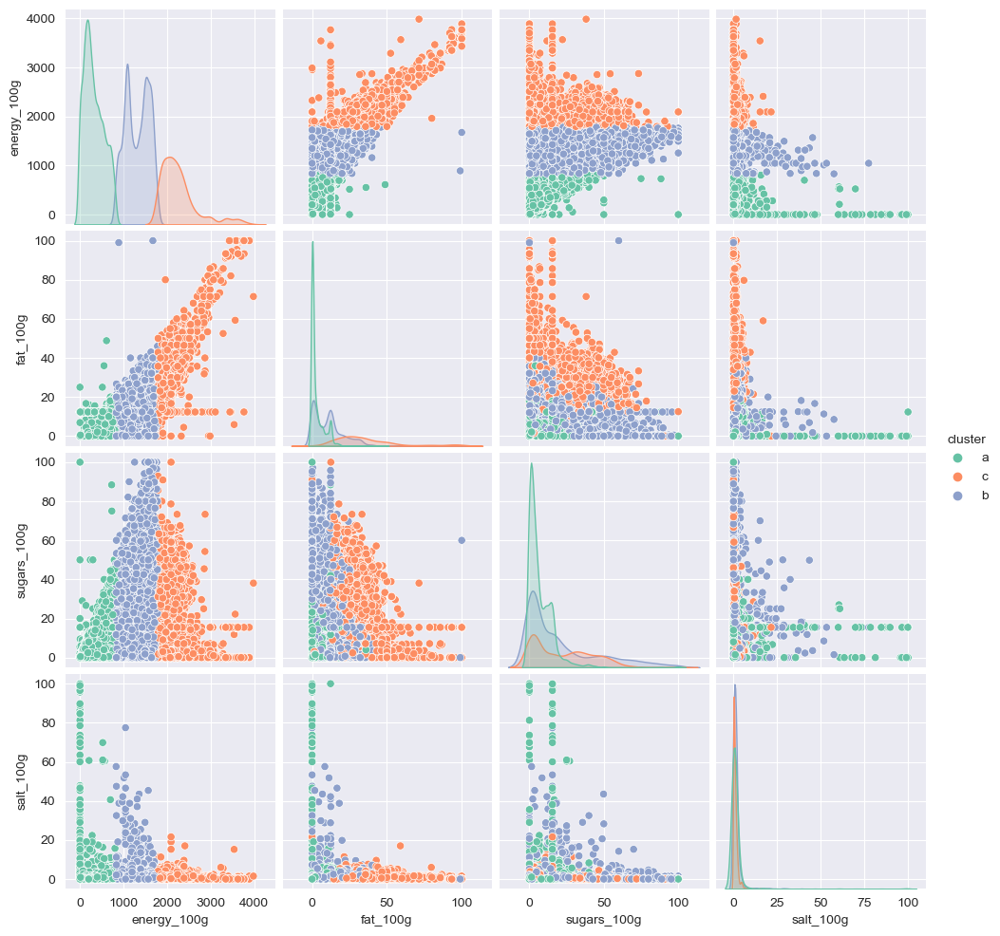

In [73]:
import random
Xdf_sample=Xdf[['energy_100g','fat_100g','sugars_100g','salt_100g','cluster']].sample(10000)
sns.pairplot(Xdf_sample, hue="cluster")

# Clustering x ACP
Maintenant je vais appliquer à une ACP à mon clustering. (ACP de 3 dimensions max pour pouvoir la visualiser)

In [84]:
#stockafe des labels et centroids des clusters
labelsbis=kmeans.labels_
centroids=kmeans.cluster_centers_
#scaler les données pour pouvoir faire l'acp
Xdf_sld=sc.fit_transform(Xdf.loc[:,Xdf.columns!="cluster"])
#on fait l'ACP à 3 dimensions
pca = PCA(n_components=3)
pca.fit(Xdf_sld)

PCA(n_components=3)

array([[3.17940342e+02, 2.80410001e+00, 1.59476041e+00, 1.13453602e+01,
        6.92497476e+00, 1.53075820e+00, 3.94297608e+00, 1.80599861e+00,
        7.53378668e-01, 4.06851862e+00],
       [1.31257341e+03, 1.07260759e+01, 4.87255962e+00, 4.45067075e+01,
        2.07623062e+01, 2.82681993e+00, 9.16180516e+00, 1.48909575e+00,
        5.91823574e-01, 1.06398550e+01],
       [2.25129715e+03, 3.47736158e+01, 1.18361509e+01, 4.42527610e+01,
        2.24251244e+01, 4.22305387e+00, 8.83370858e+00, 9.81796614e-01,
        3.90152217e-01, 1.69375827e+01]])

In [86]:
#on projette les points dans le nouvel espace
X_proj = pca.transform(Xdf_sld)
X_proj = pd.DataFrame(X_proj, columns = ["PC1", "PC2", "PC3"])
centroids_proj = sc.transform(centroids)

C:\Users\Me\AppData\Roaming\Python\Python39\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [89]:
centroids_proj=pd.DataFrame(centroids_proj)
centroids_proj

,0,1,2,3,4,5,6,7,8,9
0,-0.991373,-0.574471,-0.461901,-0.706571,-0.425821,-0.267096,-0.380694,0.048909,0.054091,-0.660787
1,0.275989,-0.096230,-0.008491,0.487653,0.264035,0.063070,0.274998,-0.004612,-0.010056,0.180816
2,1.472111,1.355493,0.954765,0.478507,0.346934,0.418755,0.233776,-0.090288,-0.090133,0.987377


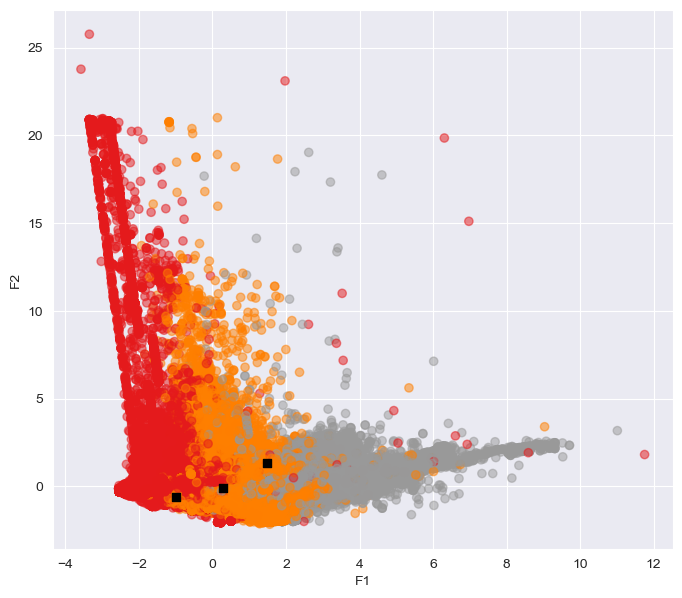

In [90]:
# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,7))

# On affiche nos individus, avec une transparence de 50% (alpha=0.5) : 
ax.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1], c= labelsbis, cmap="Set1", alpha =0.5)

# On affiche nos centroides, avec une couleur noire (c="black") et une frome de carré (marker="c") : 
ax.scatter(centroids_proj.iloc[:, 0], centroids_proj.iloc[:, 1],  marker="s", c="black" )

# On spécifie les axes x et y :
ax.set_xlabel("F1")
ax.set_ylabel("F2")
plt.show()

In [112]:
#sample pour y voir plus clair
X_proj_sample=X_proj.sample(500)
sample_index=X_proj_sample.index
labels_sample=labelsbis[sample_index]

Text(0.5, 0, 'F3')

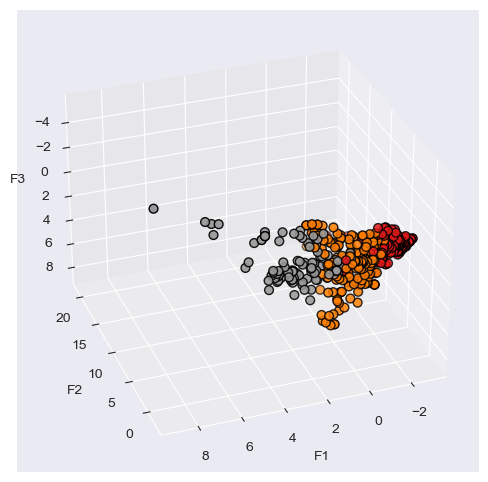

In [113]:
# On définit notre figure et notre axe différemment : 
fig= plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

# On affiche nos points : 
ax.scatter(
    X_proj_sample.iloc[:, 0],
    X_proj_sample.iloc[:, 1],
    X_proj_sample.iloc[:, 2],
    c=labels_sample, cmap="Set1", edgecolor="k", s=40)

# On spécifie le nom des axes : 
ax.set_xlabel("F1")
ax.set_ylabel("F2")
ax.set_zlabel("F3")


In [115]:
import plotly.express as px
fig = px.scatter_3d(x=X_proj_sample.iloc[:,0], y=X_proj_sample.iloc[:,1], z=X_proj_sample.iloc[:, 2],          color=labels_sample)
fig.show()

Et maintenant une classification ?

In [117]:
Xclass=pd.DataFrame(Xdf.loc[:,Xdf.columns!="cluster"])
kmeans = KMeans(n_clusters=50)
kmeans.fit(Xclass)

C:\Users\Me\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=50)

In [118]:
centroids=kmeans.cluster_centers_
centroids.shape

(50, 10)

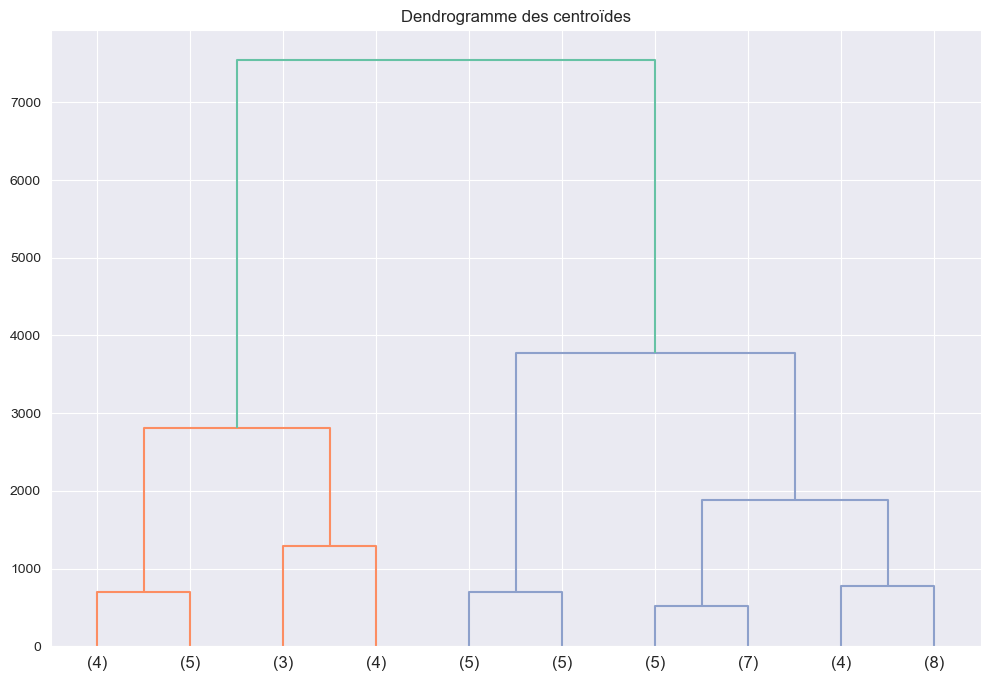

In [119]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(12, 8))  
plt.title("Dendrogramme des centroïdes")  
dend = shc.dendrogram(shc.linkage(centroids, method='ward'),p=10,truncate_mode='lastp')

# <a name="C6">  L'application </a>
<a href="#C0">SOMMAIRE</a>

Une appli qui permet de scanner un produit donner son nutriscore et si la catégorie est renseignée : en donne un autre qui a un meilleur nutrigrade dans la même catégorie /créer la fonction

prend un ID de produit (pour tester je prends aléatoire) : trouve produits similaire avec nutrigrade similaire et renvoie le produit. Affichage des 2 produits etc etc

In [237]:
def application(code):
    # on retrouve le produit scanné
    code=str(code)
    product = data[data['code'] == code]
    cols=['code','url','product_name','nutrition_grade_fr','nutrition_score_fr_100g','pnns_groups_1','energy_100g',
       'fat_100g','sugars_100g','fiber_100g', 'proteins_100g', 'salt_100g']
    # récupérer les informations souhaitées
    product_scanned = product[cols]
    category = product_scanned['pnns_groups_1'].iloc[0]
    # si la catégorie est connue, filtrer les produits de la même catégorie
    if not pd.isnull(product_scanned['pnns_groups_1'].iloc[0]):
        similar_products = data[data['pnns_groups_1']==category]
        # trier les produits par nutriscore
        similar_products = similar_products.sort_values(by='nutrition_score_fr_100g',ascending=True)
        # sélectionner les 3 premiers produits
        similar_products = similar_products[cols].head(3)
        return pd.concat([product_scanned,similar_products]).set_axis(['Scanned_Product', 'Similar_1', 
                                                                              'Similar_2', 'Similar_3'], axis='index')
    else:
        return product_scanned


In [238]:
from sklearn.cluster import KMeans

def applicationbis(code):
    code = str(code)
    product = data[data['code'] == code]
    cols = ['code','url','product_name','nutrition_grade_fr','nutrition_score_fr_100g','pnns_groups_1','energy_100g',
       'fat_100g','sugars_100g','fiber_100g', 'proteins_100g', 'salt_100g']
    product_scanned = product[cols]
    
    if not pd.isnull(product_scanned['pnns_groups_1'].iloc[0]):
        category = product_scanned['pnns_groups_1'].iloc[0]
        similar_products = data[data['pnns_groups_1'] == category]
        
        features = similar_products[['nutrition_score_fr_100g','energy_100g',
       'fat_100g','sugars_100g','fiber_100g', 'proteins_100g', 'salt_100g']]
        kmeans = KMeans(n_clusters=3, random_state=0,n_init='auto').fit(features)
        closest_products = similar_products.iloc[kmeans.labels_==kmeans.predict(features)[0]]
        closest_products = closest_products.sort_values(by='nutrition_score_fr_100g', ascending=True)
        closest_products = closest_products[cols].head(3)
        return pd.concat([product_scanned, closest_products]).set_axis(['Scanned_Product', 'Similar_1', 'Similar_2', 'Similar_3'], axis='index')
    else:
        return product_scanned


In [235]:
print(data.sample(1).code.array)
print(data[data['pnns_groups_1'].notnull()].sample(1).code.array)

<PandasArray>
['638346959975']
Length: 1, dtype: object
<PandasArray>
['5000159012041']
Length: 1, dtype: object


In [240]:
code='5000159012041'
display(application(code))
display(applicationbis(code))

,code,url,product_name,nutrition_grade_fr,nutrition_score_fr_100g,pnns_groups_1,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g
Scanned_Product,5000159012041,http://world-fr.openfoodfacts.org/produit/5000159012041/skittles-fruits-wrigley-s,Skittles Fruits,d,17.0,Sugary snacks,1712.000000,4.2,89.9,1.1,0.0,0.03000
Similar_1,859888000929,http://world-fr.openfoodfacts.org/produit/0859888000929/choco-crunch-go-raw,choco crunch,b,0.0,Sugary snacks,2277.675265,34.1,47.0,4.9,6.7,0.13000
Similar_2,871045530100,http://world-fr.openfoodfacts.org/produit/0871045530100/vanille-suiker-crowny,Vanille suiker,b,0.0,Sugary snacks,1072.040704,0.5,53.1,1.1,0.9,0.03653
Similar_3,3336260000090,http://world-fr.openfoodfacts.org/produit/3336260000090/tourteaux-fromager-jahan,tourteaux fromager,b,0.0,Sugary snacks,1903.438952,21.0,30.5,2.6,6.1,0.57000


,code,url,product_name,nutrition_grade_fr,nutrition_score_fr_100g,pnns_groups_1,energy_100g,fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g
Scanned_Product,5000159012041,http://world-fr.openfoodfacts.org/produit/5000159012041/skittles-fruits-wrigley-s,Skittles Fruits,d,17.0,Sugary snacks,1712.000000,4.2,89.9,1.1,0.0,0.03
Similar_1,7702025182305,http://world-fr.openfoodfacts.org/produit/7702025182305/recreo,Recreo,b,0.0,Sugary snacks,1903.438952,21.0,30.5,2.6,6.1,0.57
Similar_2,3582730001719,http://world-fr.openfoodfacts.org/produit/3582730001719/patisserie-orientale-zalabia-x2-sans-marque,Pâtisserie orientale (Zalabia x2),b,0.0,Sugary snacks,1903.438952,21.0,30.5,2.6,6.1,0.57
Similar_3,3582739701887,http://world-fr.openfoodfacts.org/produit/3582739701887/mini-montecao-x4-les-delices-de-djamila,Mini Montecao x4,b,0.0,Sugary snacks,1903.438952,21.0,30.5,2.6,6.1,0.57
